# Credit Card User Churn Prediction Project
by Michele Casalgrandi

## Background
The Thera bank credit cards are a good source of revenues resulting from various fees charged by the bank (annual fees, balance transfer fees, late payment fees, interest charges, etc.)

However, the bank has seen a steep decline in the number of users of the credit cards with resulting loss of revenues.

The bank wants to find out what are the reasons for the drop in credit cards customers and have a predictive model to identify which customers are likely to drop the credit card.

## Objectives
* Build a predictive model to identify customers likely to drop the credit card
* Identify the most important predictors for customers dropping the credit card

### Data Dictionary

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
* Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
* Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
* Avg_Utilization_Ratio: Represents how much of the available credit the customer spent


### Exploratory Data Analysis (EDA)

##### Import libraries and load data set

In [669]:
# Import needed libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

sns.set()

import warnings

warnings.filterwarnings("ignore")

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To build linear model for prediction
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier

from xgboost import XGBClassifier

from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, cross_val_score

# To check model performance
from sklearn import metrics

# Missing data treatment
from sklearn.impute import SimpleImputer, KNNImputer

# import function transformer
from sklearn.preprocessing import FunctionTransformer, OneHotEncoder, LabelBinarizer
from sklearn.compose import ColumnTransformer

# set random seed for consistent results across runs
np.random.seed(1)

# oversample and undersample
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

from sklearn.pipeline import Pipeline

In [670]:
# Load dataset
data_filename = 'BankChurners.csv'
df = pd.read_csv(data_filename)

# get shape
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns in the data set.")

There are 10127 rows and 21 columns in the data set.


In [671]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [672]:
# check the data type of each column
df.dtypes

CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

In [673]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

There are missing values in `Education_Level` and `Marital_Status`

In [674]:
df[df['Marital_Status'].isna()].sample(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
8688,715469583,Existing Customer,40,F,2,Graduate,NaN,$40K - $60K,Blue,36,3,1,2,2136.000,1250,886.000,0.740,7782,88,0.660,0.585
9047,718353633,Attrited Customer,50,M,1,Post-Graduate,NaN,$80K - $120K,Gold,36,2,3,2,34516.000,0,34516.000,1.032,5547,75,0.744,0.000
6269,709054083,Existing Customer,50,F,1,Graduate,NaN,Less than $40K,Blue,32,6,1,3,2652.000,1911,741.000,0.831,4816,79,0.881,0.721
7657,709813008,Existing Customer,44,F,3,High School,NaN,Less than $40K,Blue,35,5,3,0,3398.000,2415,983.000,0.891,4509,93,0.661,0.711
1714,713464983,Existing Customer,45,F,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,4,4947.000,1053,3894.000,1.195,3479,76,0.810,0.213
9295,719324658,Existing Customer,27,M,0,College,NaN,$80K - $120K,Silver,19,1,1,3,34516.000,1131,33385.000,0.715,14716,112,0.750,0.033
4407,793269933,Existing Customer,46,M,3,Graduate,NaN,$60K - $80K,Silver,40,6,3,2,28829.000,0,28829.000,0.463,4540,78,0.560,0.000
1494,789079758,Existing Customer,44,M,4,Doctorate,NaN,$120K +,Blue,32,3,2,3,34516.000,1356,33160.000,1.169,1531,48,0.655,0.039
6852,721011858,Existing Customer,63,M,1,Graduate,NaN,Less than $40K,Blue,52,6,3,3,1438.300,0,1438.300,0.854,3913,78,0.500,0.000
1497,778275783,Existing Customer,37,F,2,NaN,NaN,Less than $40K,Blue,27,5,1,2,2868.000,1434,1434.000,0.777,2909,64,0.488,0.500


There is no clear pattern for observations with missing Marital_Status

In [675]:
# check for duplicates
df.duplicated().sum()

0

There are no duplicates.

In [676]:
# check unique values
df.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

Column `CLIENTNUM` is unique for each row, we will drop it as it doesn't add value to the analysis or the models

In [677]:
columns_to_drop = ['CLIENTNUM']
df.drop('CLIENTNUM', axis=1, inplace=True)

In [678]:
# view beginning of data set
df.head(10)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000
5,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,4010.000,1247,2763.000,1.376,1088,24,0.846,0.311
6,Existing Customer,51,M,4,NaN,Married,$120K +,Gold,46,6,1,3,34516.000,2264,32252.000,1.975,1330,31,0.722,0.066
7,Existing Customer,32,M,0,High School,NaN,$60K - $80K,Silver,27,2,2,2,29081.000,1396,27685.000,2.204,1538,36,0.714,0.048
8,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,22352.000,2517,19835.000,3.355,1350,24,1.182,0.113
9,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,6,3,3,11656.000,1677,9979.000,1.524,1441,32,0.882,0.144


In [679]:
# view end of data
df.tail()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


#### Numerical Variables

In [680]:
# set numerical format for pandas
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# get numerical data statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000
Total_Amt_Chng_Q4_Q1,10127.000,0.760,0.219,0.000,0.631,0.736,0.859,3.397


#### Numerical Variables Observations

* `Customer_Age` ranges from 26 to 73
* `Dependent_count` ranges from 0 to 5 with a median of 2
* `Month_on_book` ranges from 13 to 56
* `Total_Relationship_Count` ranges from 1 to 6 with a median of 4
* `Month_Inactive_12_mon` ranges from 0 to 6 and is slightly skewed to the right
* `Contacts_Count_12_mon` ranges from 0 to 6 with a slight skew to the right
* `Credit_Limit` ranges from 1483 to 34516.  It has a large std deviation and is skewed to the right.
* `Total_Revolving_Bal` ranges from 0 to 2517 sligtly skewed to the right
* `Avg_Open_To_Buy` ranges from 3 to 34516, has a high std deviation and is skewed to the right
* `Total_Amt_Chng_Q4_Q1` has an average of 0.760 and is highly skewed to the right
* `Total_Trans_Amt` ranges from 510 to 18484 and highly skewed to the right
* `Total_Trans_Ct` ranges from 10 to 139 with a median of 67 and skewed to the right
* `Total_Ct_Chng_Q4_Q1` has an average of 0.712 and is skewed to the right
* `Avg_Utilization_Ratio` has an average of 0.275 and is skewed to the right

#### Categorical Variables

In [681]:
# Get categorical columns
cat_cols = df.select_dtypes(include=['object']).columns
print(cat_cols)

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')


In [682]:
# get value counts for each categorical column
for col in cat_cols:
    print(f"\n------------------\n{col}:")
    print(df[col].value_counts())


------------------
Attrition_Flag:
Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

------------------
Gender:
F    5358
M    4769
Name: Gender, dtype: int64

------------------
Education_Level:
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

------------------
Marital_Status:
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

------------------
Income_Category:
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64

------------------
Card_Category:
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64


#### Categorical Variables Observations
* Target variable `Attrition_Flag` is an imbalanced class with 8500 'Existing Customer' and 1627 'Attrited Customers'
* `Gender` is almost equally divided with 'Male' and 'Female'
* `Education_Level` is a class with six levels
* `Marital` status has three levels with the majority either 'Married' or 'Single'
* `Income` has six levels. One of them ('abc') is invalid (1112 observations)
* `Card_Category` has four levels, the majority is 'Blue'

### Univariate EDA

In [683]:
# function takes a numerical column as the input and returns the boxplots 
# and histograms for the variable.
def histogram_boxplot(feature, figsize=(15,15), bins = None):
    """ Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2, # Number of rows of the subplot grid= 2
                                           sharex = True, # x-axis will be shared among all subplots
                                           gridspec_kw = {"height_ratios": (.25, .75)}, 
                                           figsize = figsize 
                                           ) # creating the 2 subplots
    sns.boxplot(feature, ax=ax_box2, showmeans=True, color='violet') # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=False, ax=ax_hist2, bins=bins) if bins else sns.distplot(feature, kde=False, ax=ax_hist2) # For histogram
    ax_hist2.axvline(np.mean(feature), color='green', linestyle='--') # Add mean to the histogram
    ax_hist2.axvline(np.median(feature), color='black', linestyle='-') # Add median to the histogram


##### Customer_Age

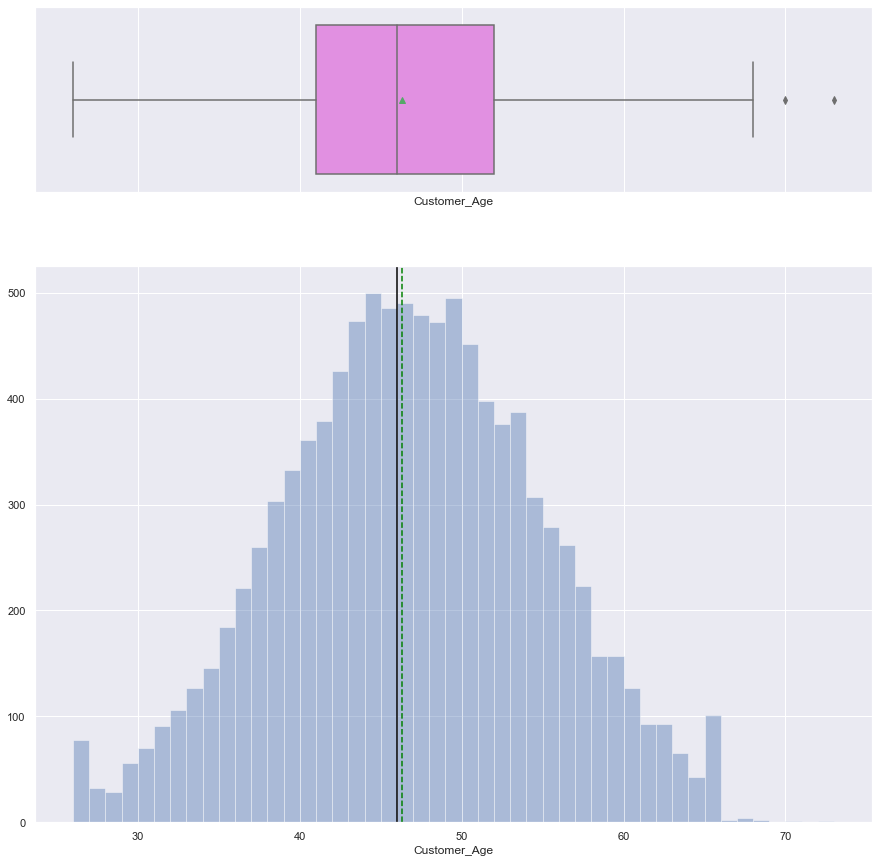

In [684]:
histogram_boxplot(df['Customer_Age'])

`Customer_Age` is normally distributed with a few outliers to the right.

##### Dependent_count

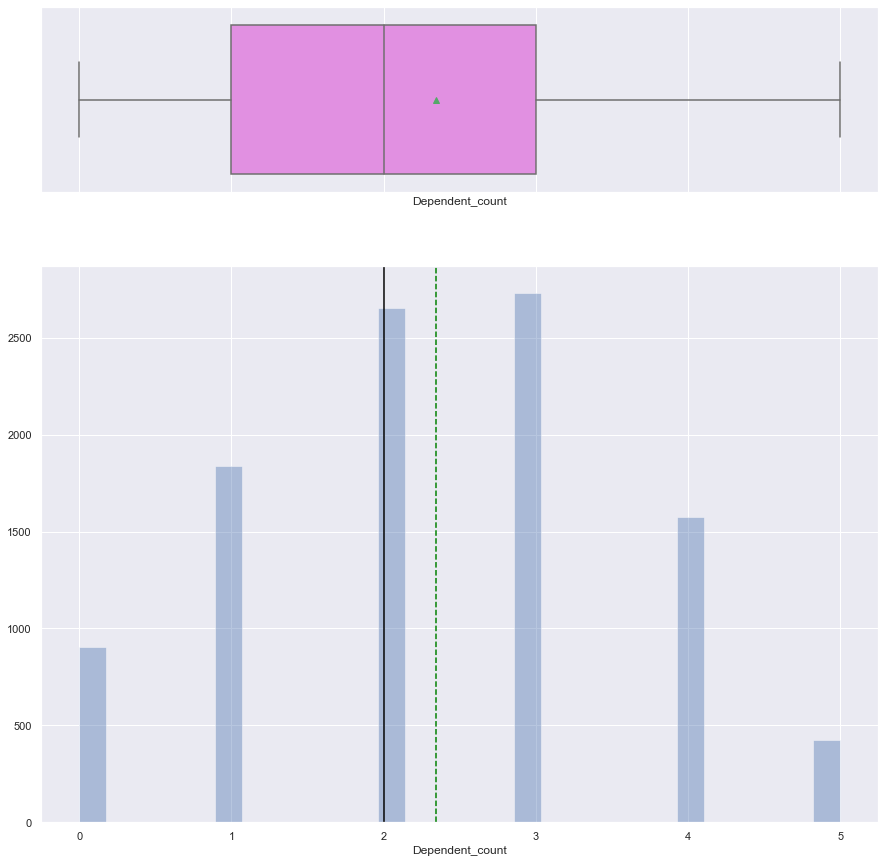

In [685]:
histogram_boxplot(df['Dependent_count'])

`Dependent_count` is roughly normally distributed

##### Months_on_book

In [686]:
df['Months_on_book'].value_counts().head(5)

36    2463
37     358
34     353
38     347
39     341
Name: Months_on_book, dtype: int64

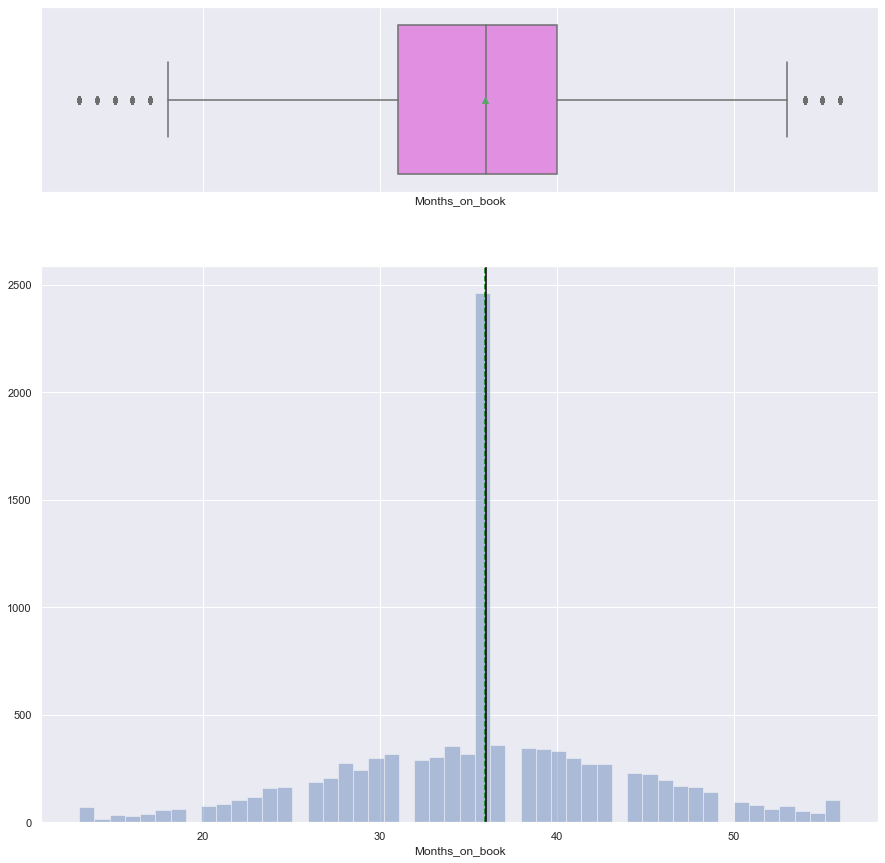

In [687]:
histogram_boxplot(df['Months_on_book'])

`Months_on_book` is normally distributed with the exception of a large peak at 36 (three years) of 2436 customers.  Only a few outliers.

##### Total_Relationship_Count

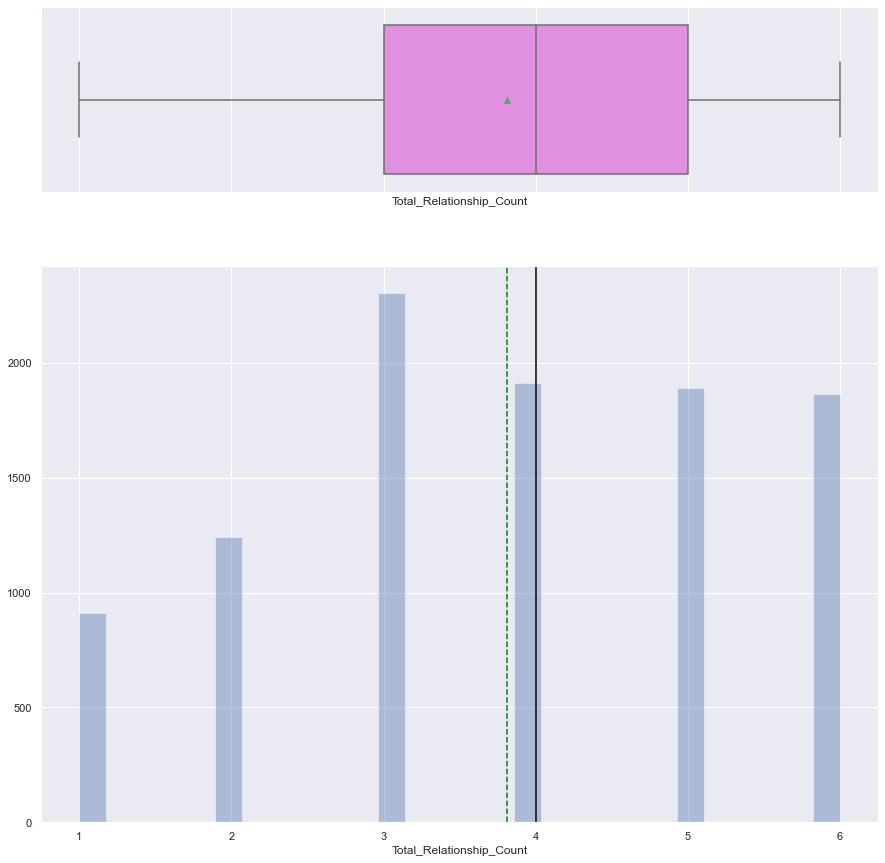

In [688]:
histogram_boxplot(df['Total_Relationship_Count'])

Most customers have three products closely followed by 4, 5, and 6 with similar counts.

##### Months_Inactive_12_mon

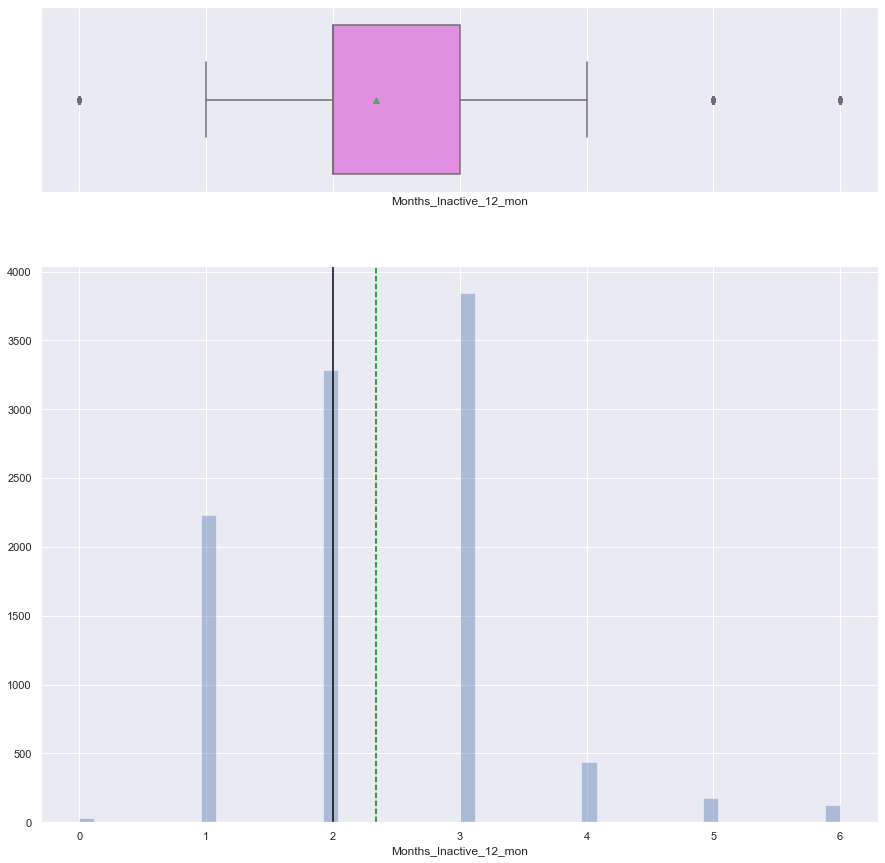

In [689]:
histogram_boxplot(df['Months_Inactive_12_mon'])

Surprisingly most customers have been inactive between one and three months with low counts for zero, four, five and six.

##### Contact_Count_12_mon

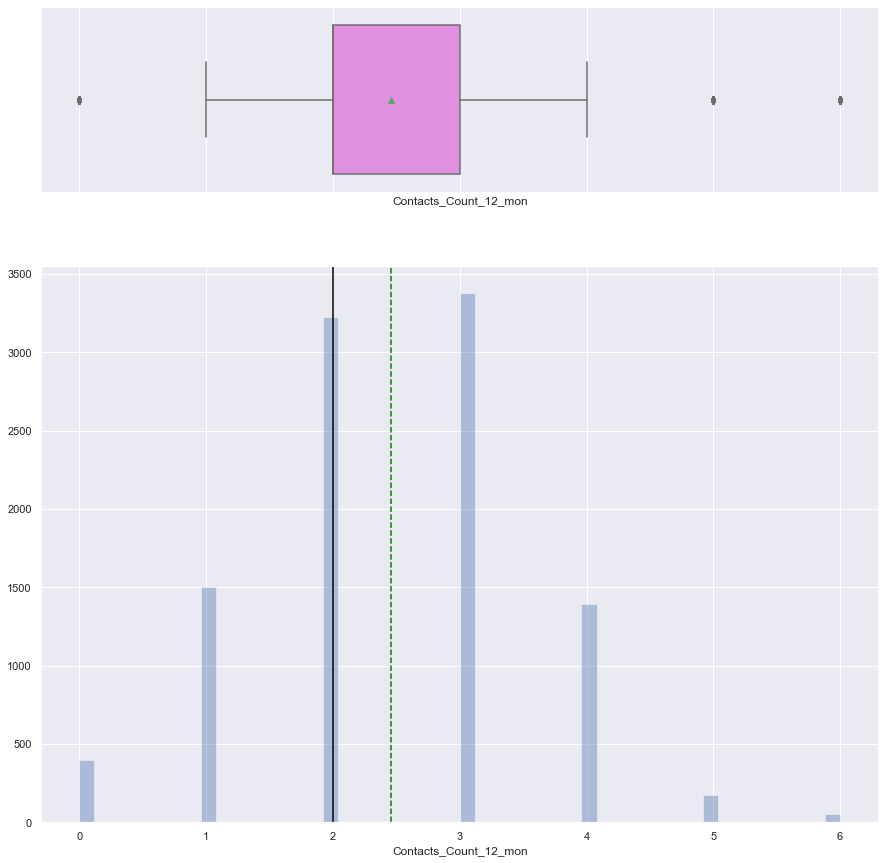

In [690]:
histogram_boxplot(df['Contacts_Count_12_mon'])

Roughly normally distributed with a right tail (six contacts)

##### Credit_Limit

In [691]:
df['Credit_Limit'].value_counts()

34516.000    508
1438.300     507
15987.000     18
9959.000      18
23981.000     12
            ... 
3891.000       1
19354.000      1
34427.000      1
14527.000      1
8206.000       1
Name: Credit_Limit, Length: 6205, dtype: int64

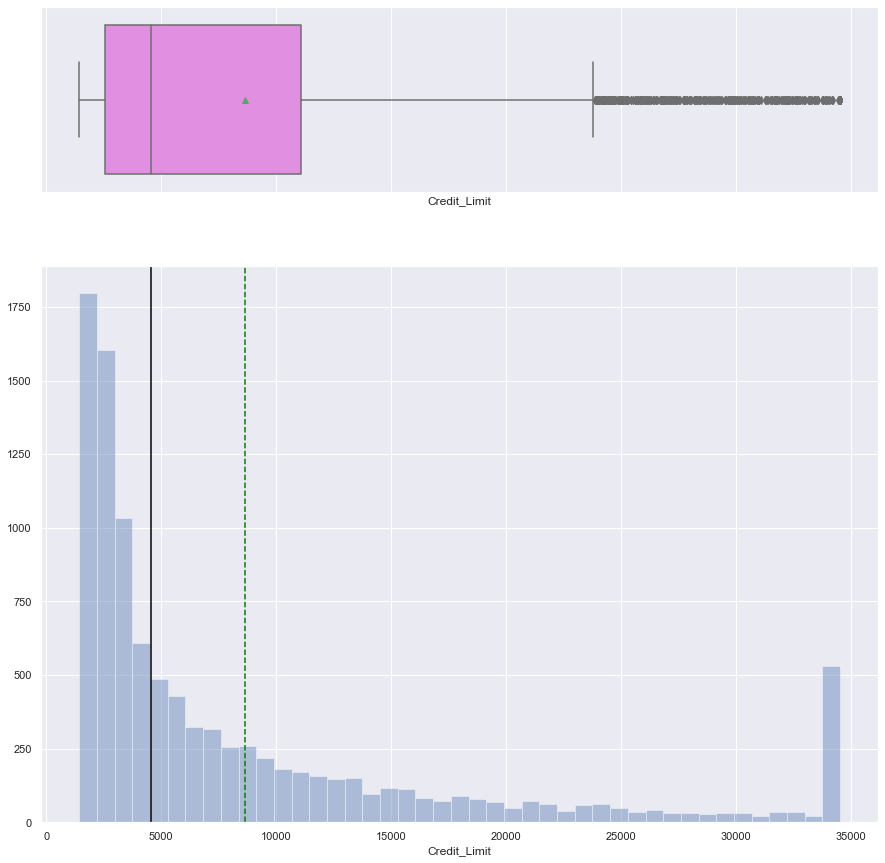

In [692]:
histogram_boxplot(df['Credit_Limit'])

Data is highly skewed to the right with two peaks at 1438 (507 obs) and 34516 (508 obs) possibly the minimum and maximum values for credit limit allowed by the bank.

We will log transform the variable.  As log transform doesn't depend on data distribution we can do this prior to splitting the data between train and test.

In [693]:
# create copy of riginal data set
processed_data = df.copy()

# get a transformer
log_transf = FunctionTransformer(np.log)

# keep list of columns to apply log transform to
col_log_transform = ['Credit_Limit']

# transform with log and drop Credit_Limit
processed_data['Credit_Limit_log'] = log_transf.transform(df['Credit_Limit'])
processed_data.drop('Credit_Limit', axis=1, inplace=True)

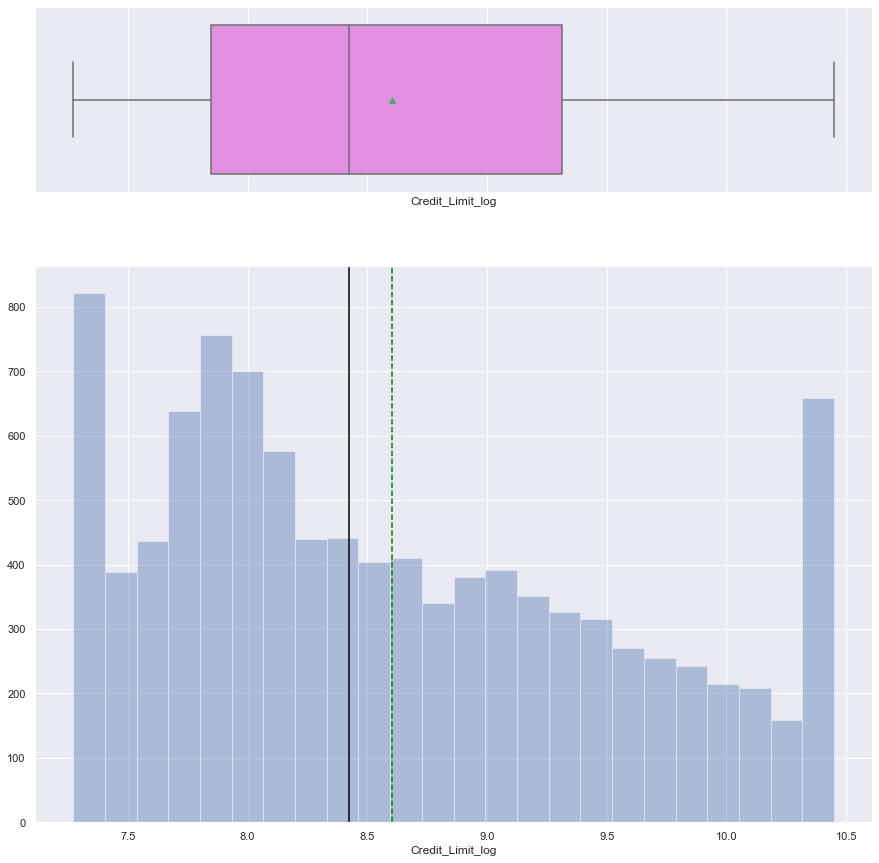

In [694]:
histogram_boxplot(processed_data['Credit_Limit_log'])

`Credit_Limit_log` distribution is improved over the original `Credit_Limit`

##### Total_Revolving_Bal

In [695]:
df['Total_Revolving_Bal'].value_counts()

0       2470
2517     508
1965      12
1480      12
1720      11
        ... 
1401       1
2293       1
2172       1
2040       1
204        1
Name: Total_Revolving_Bal, Length: 1974, dtype: int64

Many customers (2470) have a revolving balance of zero.  Also many (508) have a revolving balance of 2517 (the maximum value in the data set).

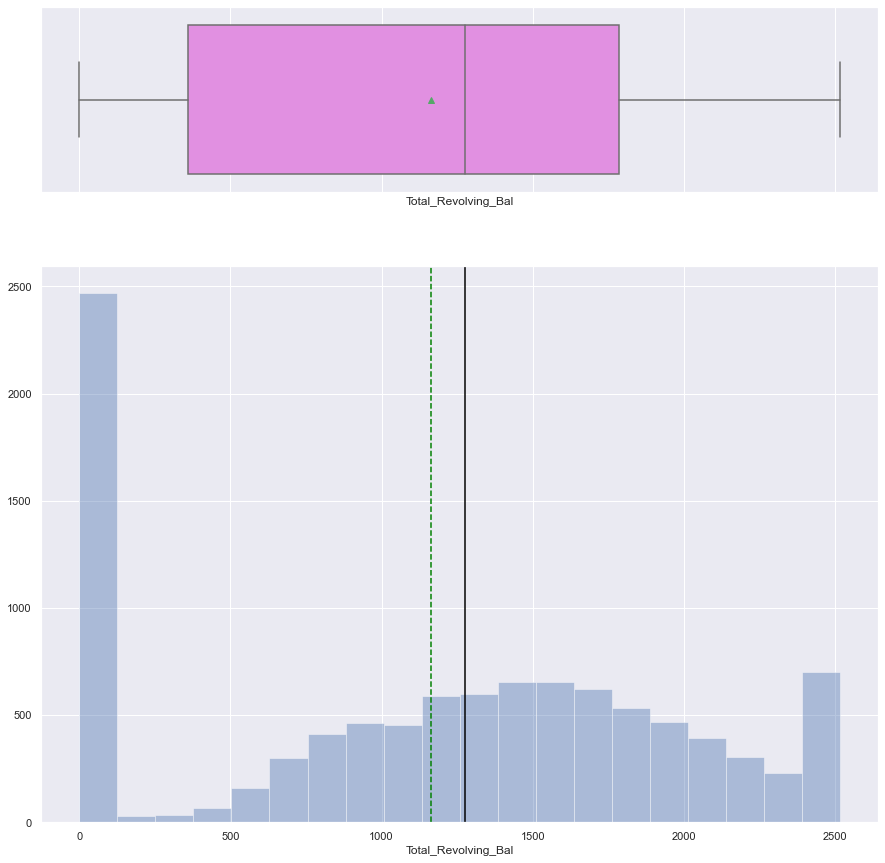

In [696]:
histogram_boxplot(df['Total_Revolving_Bal'])

Aside from the peaks at the minimum and maximum, the rest of the data is normally distributed with a slight left skew.

##### Avg_Open_To_Buy

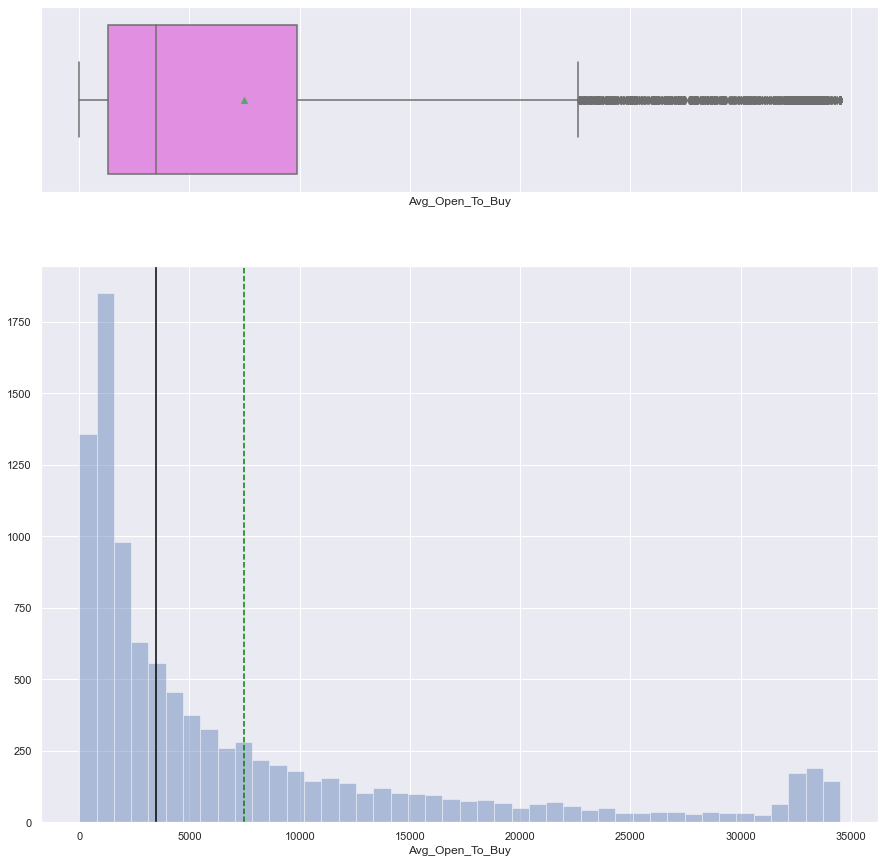

In [697]:
histogram_boxplot(df['Avg_Open_To_Buy'])

The data is highly skewed to the right.

Log transform will create a left skew to the data.  We will instead to use a square root transform to reduce the skew.

As the square root transform is independent from the data distribution we can transform prior to splitting between train and test.

In [698]:
# create square root transformer
sqrt_transf = FunctionTransformer(np.sqrt)

# keep track of columns to transform using sqrt
col_sqrt_transf = ['Avg_Open_To_Buy']

# transform and drop original column
processed_data['Avg_Open_To_Buy_sqrt'] = sqrt_transf.transform(df['Avg_Open_To_Buy'])
processed_data.drop('Avg_Open_To_Buy', axis=1, inplace=True)

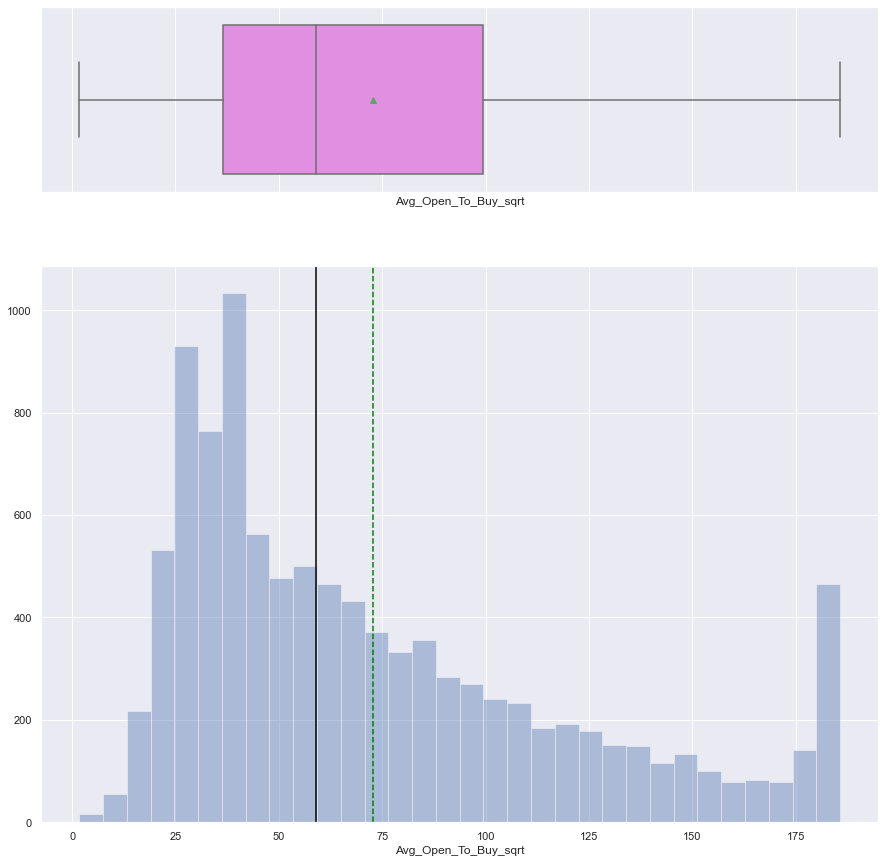

In [699]:
histogram_boxplot(processed_data['Avg_Open_To_Buy_sqrt'])

Although the right skew is not elimated is not as severe as in the original feature.

In [700]:
##### Total_Amn_Chng_Q4_Q1

In [701]:
df['Total_Amt_Chng_Q4_Q1'].sort_values(ascending=False).head(10)

12    3.397
8     3.355
773   2.675
2     2.594
219   2.368
47    2.357
46    2.316
658   2.282
58    2.275
466   2.271
Name: Total_Amt_Chng_Q4_Q1, dtype: float64

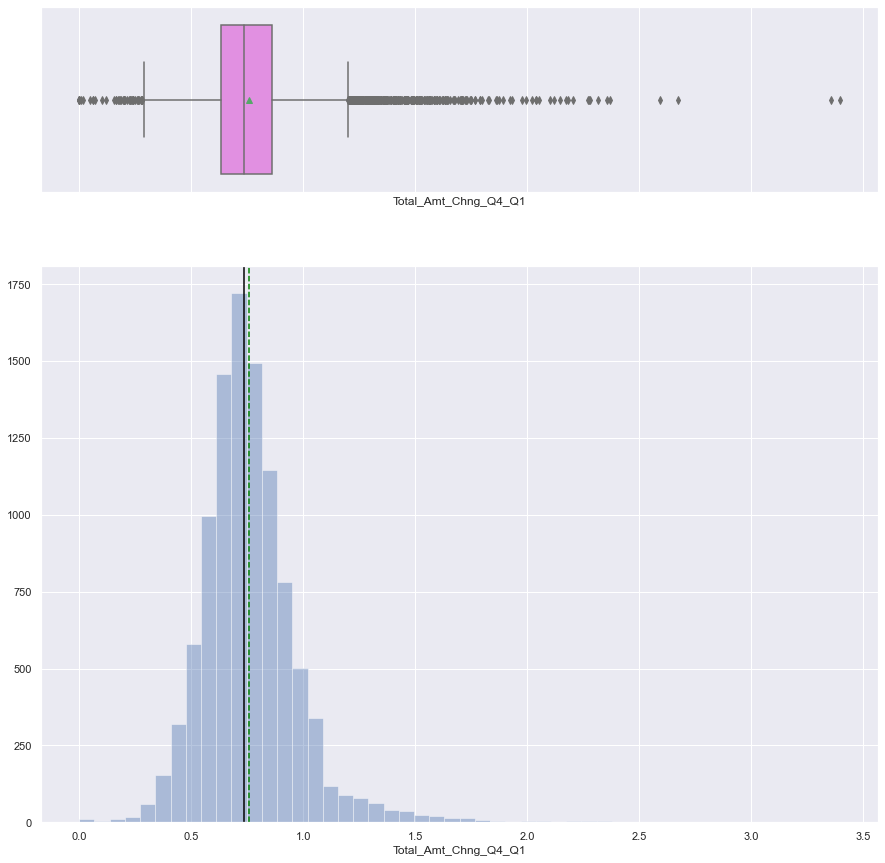

In [702]:
histogram_boxplot(df['Total_Amt_Chng_Q4_Q1'])

Data is heavily right skewed.

There are some large outliers

We will transform with square root.

In [703]:
col_sqrt_transf.append('Total_Amt_Chng_Q4_Q1')

# transform and drop original column
processed_data['Total_Amt_Chng_Q4_Q1_sqrt'] = sqrt_transf.transform(df['Total_Amt_Chng_Q4_Q1'])
processed_data.drop('Total_Amt_Chng_Q4_Q1', axis=1, inplace=True)

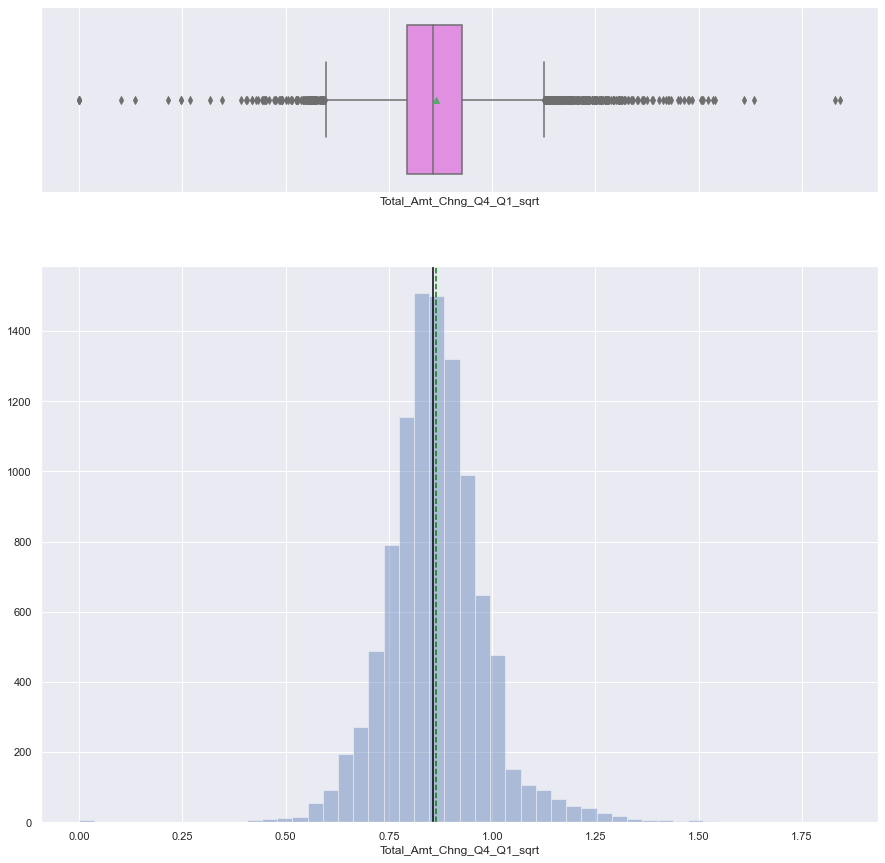

In [704]:
histogram_boxplot(processed_data['Total_Amt_Chng_Q4_Q1_sqrt'])

Skew has been removed although there are long tails with some distant outliers

##### Total_Trans_Amt

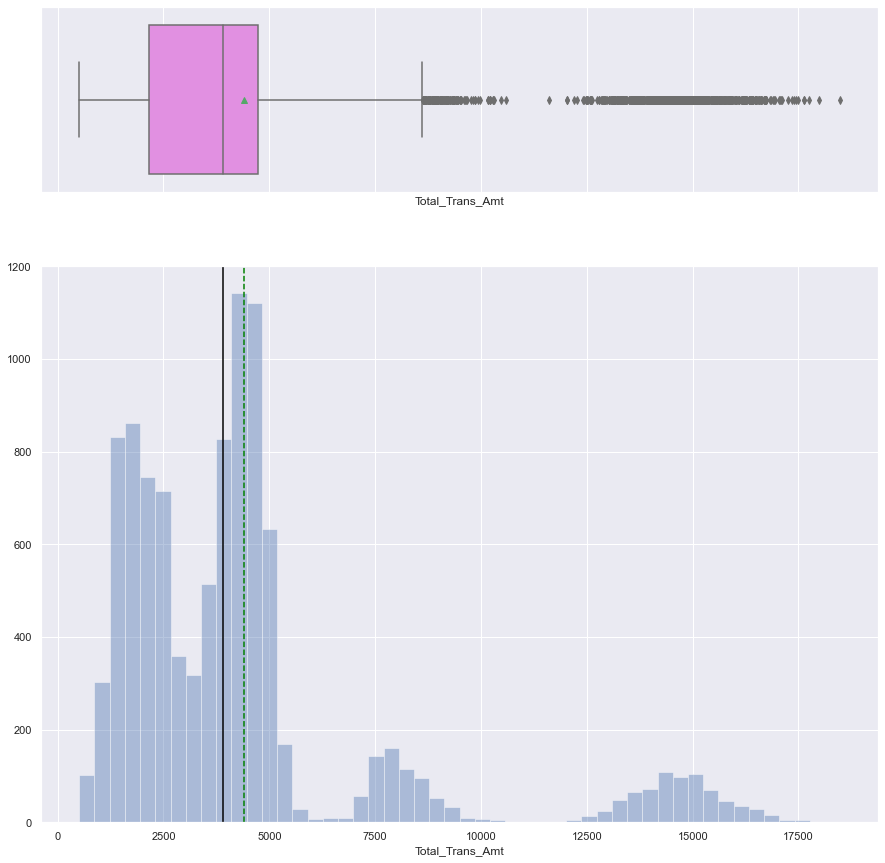

In [705]:
histogram_boxplot(df['Total_Trans_Amt'])

`Total_Trans_Amt` has a multimodal distribution with a right skew.

##### Total_Trans_ct

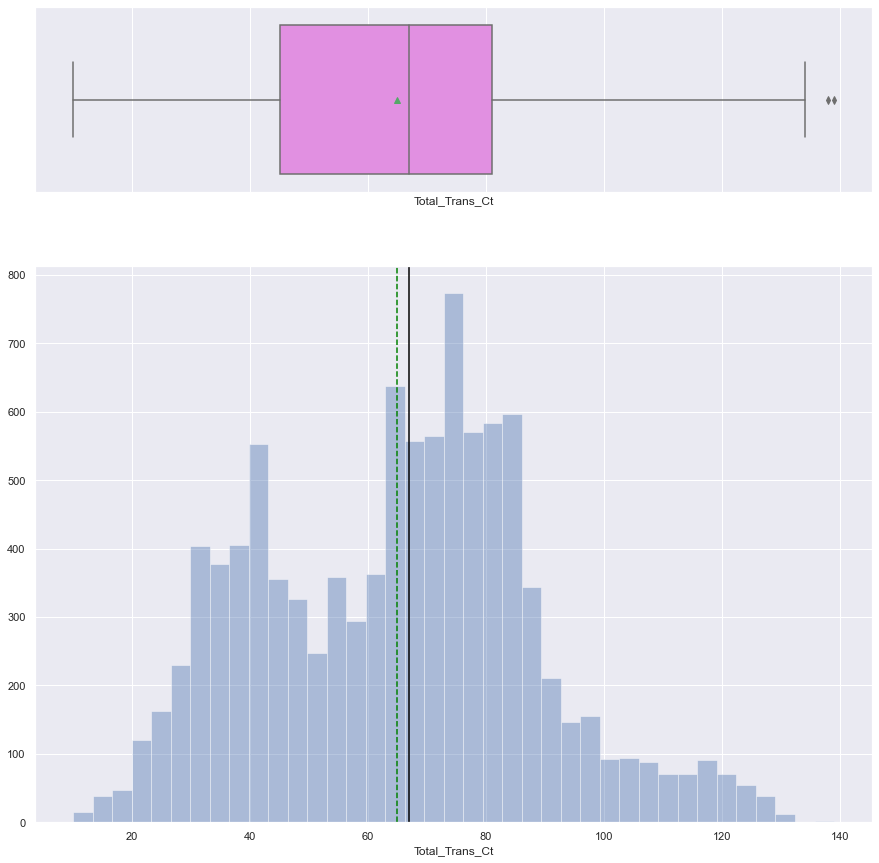

In [706]:
histogram_boxplot(df['Total_Trans_Ct'])

##### Total_Ct_Chng_Q4_Q1

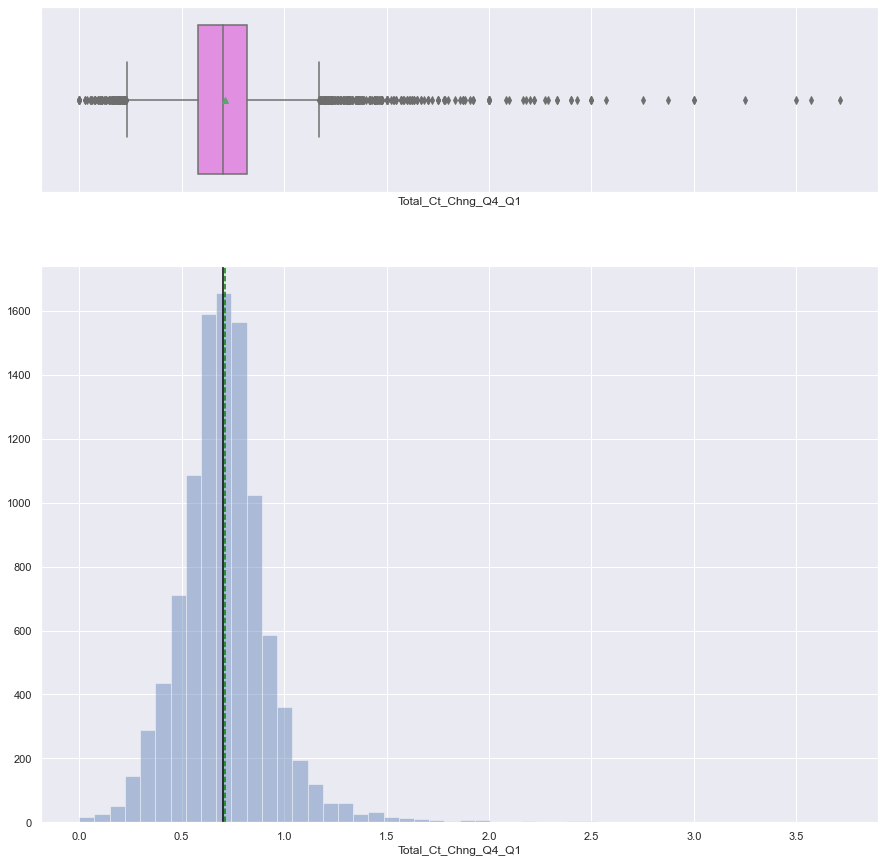

In [707]:
histogram_boxplot(df['Total_Ct_Chng_Q4_Q1'])

There is a right skew with a long right tail.

We will transform using square root.

In [708]:
col_sqrt_transf.append('Total_Ct_Chng_Q4_Q1')

# transform and drop original column
processed_data['Total_Ct_Chng_Q4_Q1_sqrt'] = sqrt_transf.transform(df['Total_Ct_Chng_Q4_Q1'])
processed_data.drop('Total_Ct_Chng_Q4_Q1', axis=1, inplace=True)

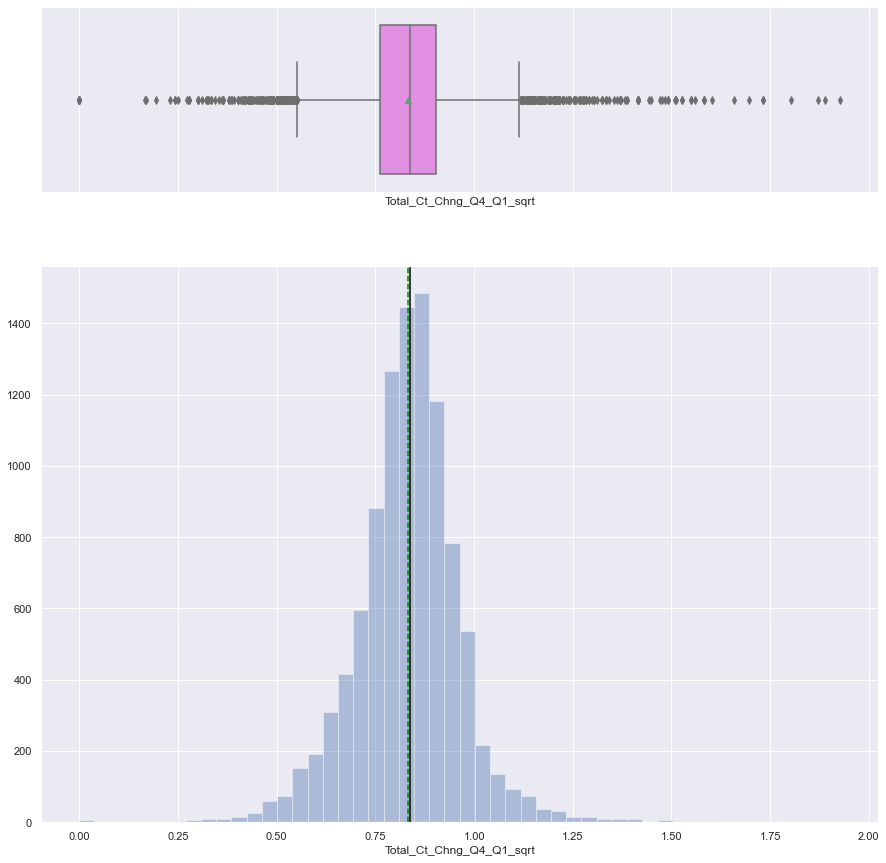

In [709]:
histogram_boxplot(processed_data['Total_Ct_Chng_Q4_Q1_sqrt'])

The distribution is now more centered although there still are long tails with outliers.

##### Avg_Utilization_Ratio

In [710]:
df['Avg_Utilization_Ratio'].value_counts()

0.000    2470
0.073      44
0.057      33
0.048      32
0.060      30
         ... 
0.929       1
0.874       1
0.995       1
0.011       1
0.985       1
Name: Avg_Utilization_Ratio, Length: 964, dtype: int64

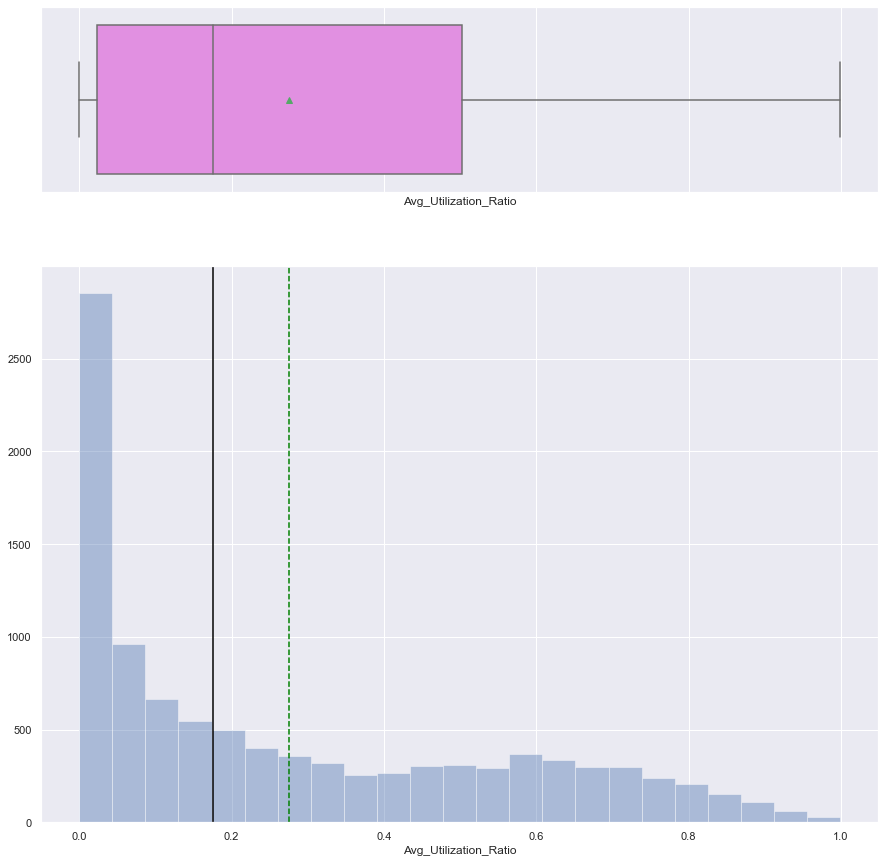

In [711]:
histogram_boxplot(df['Avg_Utilization_Ratio'])

There are 2470 customers with zero utilization (none of the available credit is used)

##### Avg_Utilization_Ratio

In [712]:
df['Avg_Utilization_Ratio'].value_counts()

0.000    2470
0.073      44
0.057      33
0.048      32
0.060      30
         ... 
0.929       1
0.874       1
0.995       1
0.011       1
0.985       1
Name: Avg_Utilization_Ratio, Length: 964, dtype: int64

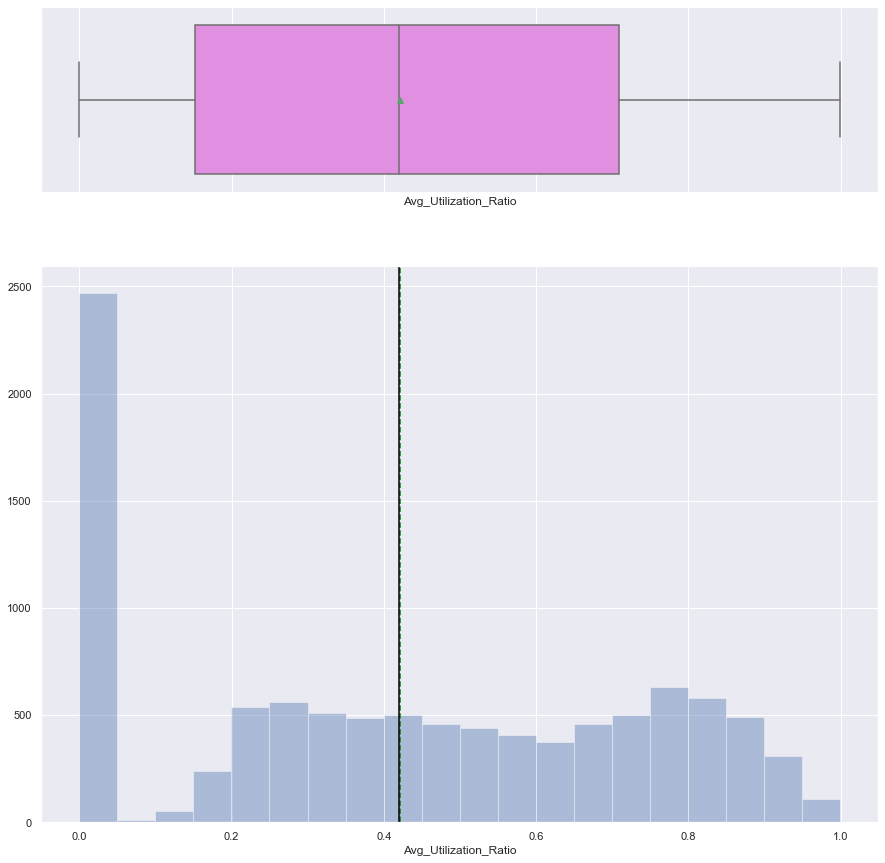

In [713]:
histogram_boxplot(np.sqrt(df['Avg_Utilization_Ratio']))

Many values are zero (2470).

##### Categorical variables univariate analysis

In [714]:
# define function to plot the counts and percentages
def perc_on_bar(z):
    '''
    plot a categorical variable using countplot and add percentages for each value
    z: categorical feature
    the function won't work if a column is passed in hue parameter
    '''

    total = len(z) # length of the column
    plt.figure(figsize=(15,5))
    #plt.xticks(rotation=45)
    ax = sns.countplot(z,palette='Paired')
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        
        ax.annotate(percentage, (x, y), size = 12) # annotate the percentage 
    plt.show() # show the plot

##### Gender

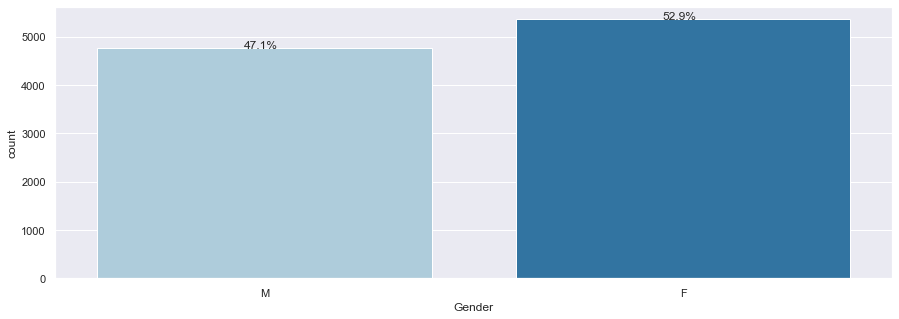

In [715]:
perc_on_bar(df["Gender"])

53% of customers are Female and 47% Male

##### Education_Level

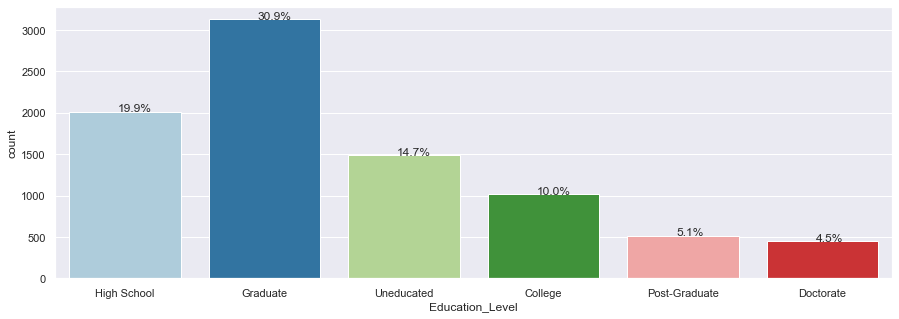

In [716]:
perc_on_bar(df["Education_Level"])

Most customers have an education of 'Graduate' with 31% followed by 'High School' at 20%.

##### Marital_Status

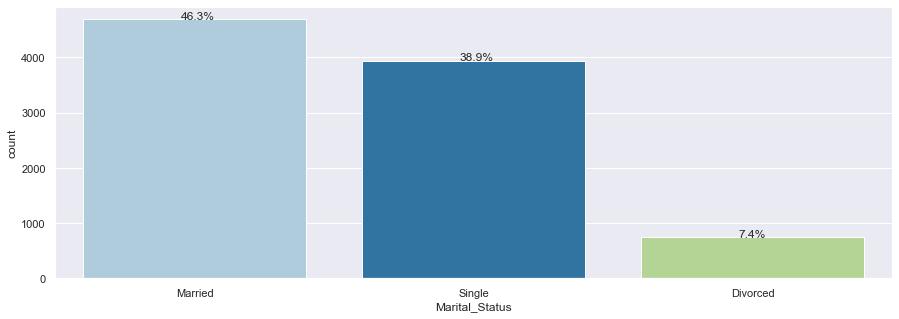

In [717]:
perc_on_bar(df["Marital_Status"])

##### Income_Category

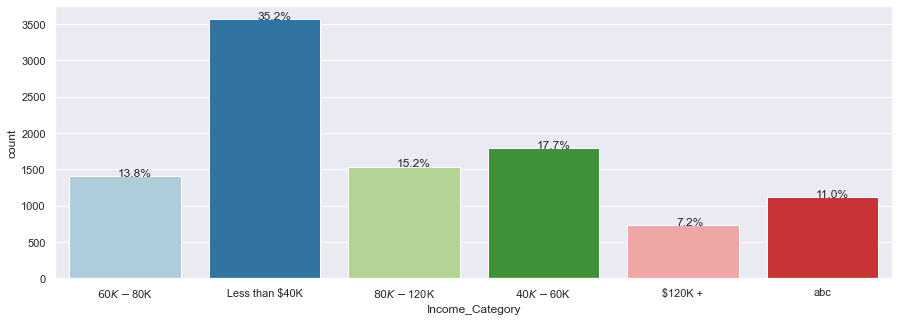

In [718]:
perc_on_bar(df["Income_Category"])

Most customers have an income of 'Less than $40K' at 35% followed by '40-60K' at 18%.

11% of customers have associated an invalid entry ('abc').  We will consider those values as missing and will impute them.

##### Card_Category

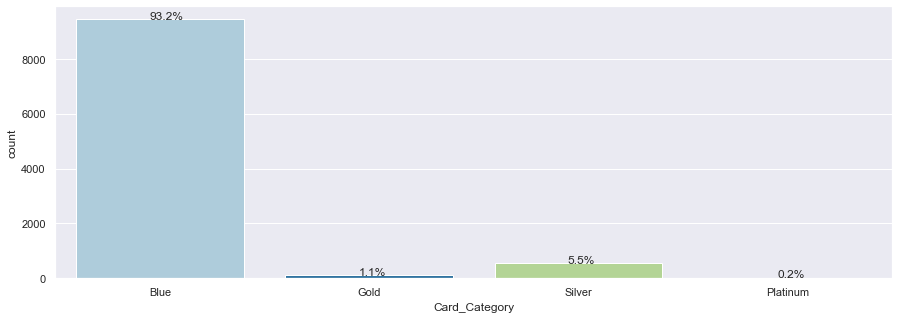

In [719]:
perc_on_bar(df["Card_Category"])

The vast majority of customers have a 'Blue' credit card (93%) followed by 'Silver' at 5.5%

##### Attrition_Flag

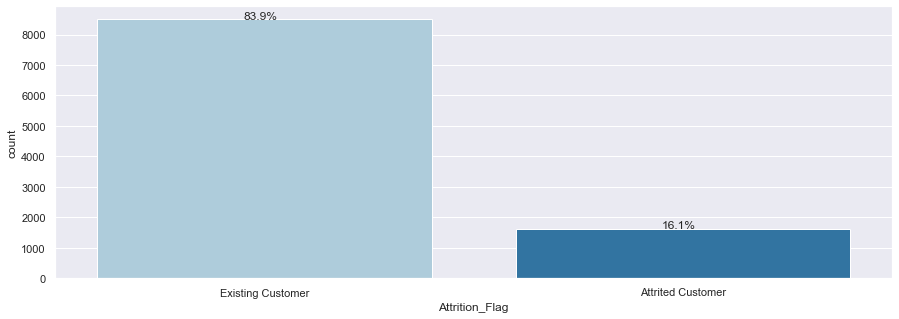

In [720]:
perc_on_bar(df['Attrition_Flag'])

16.1% of customer dropped their credit card.

## By-Variate Analysis

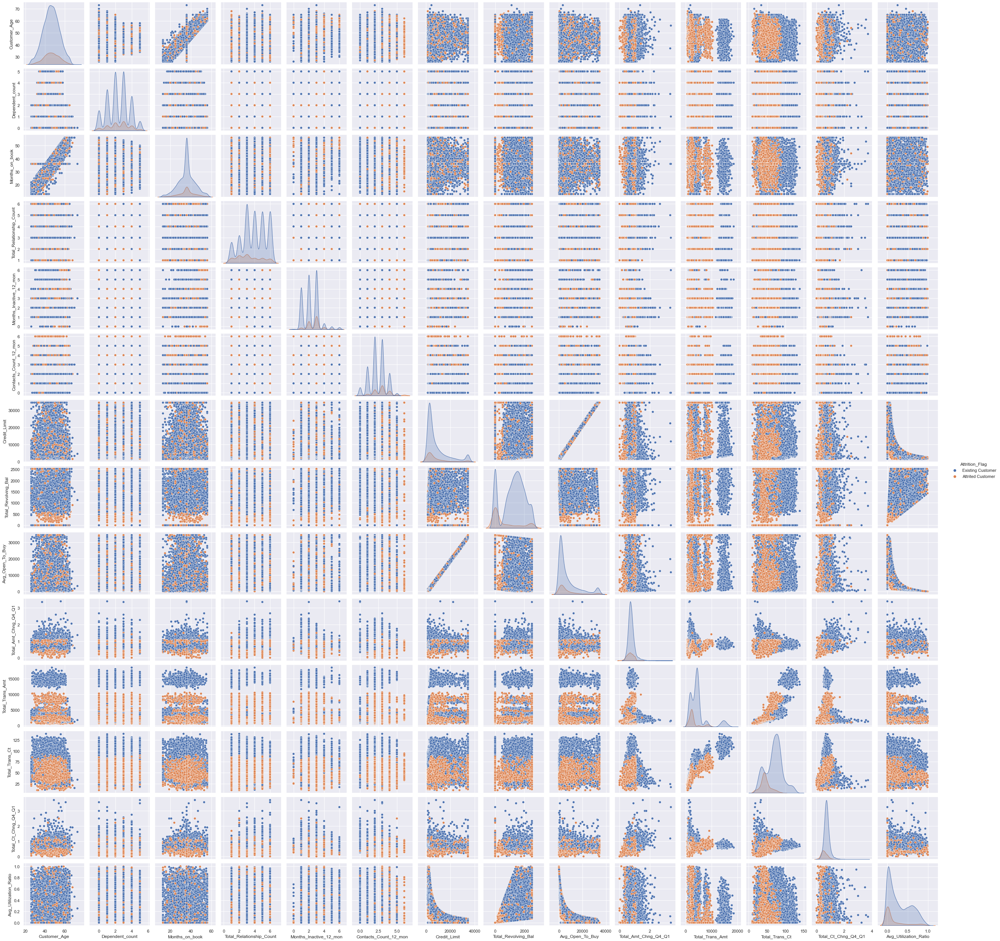

In [721]:
sns.pairplot(df, hue='Attrition_Flag')

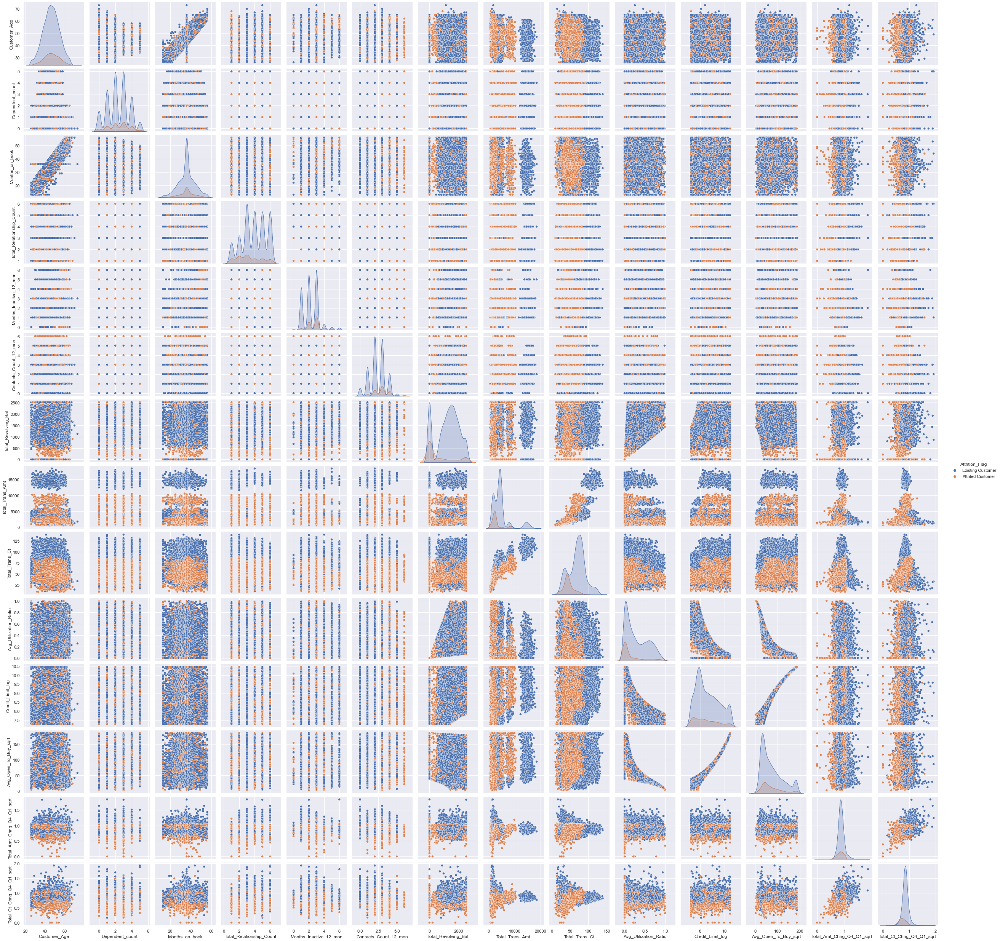

In [722]:
sns.pairplot(processed_data, hue='Attrition_Flag')

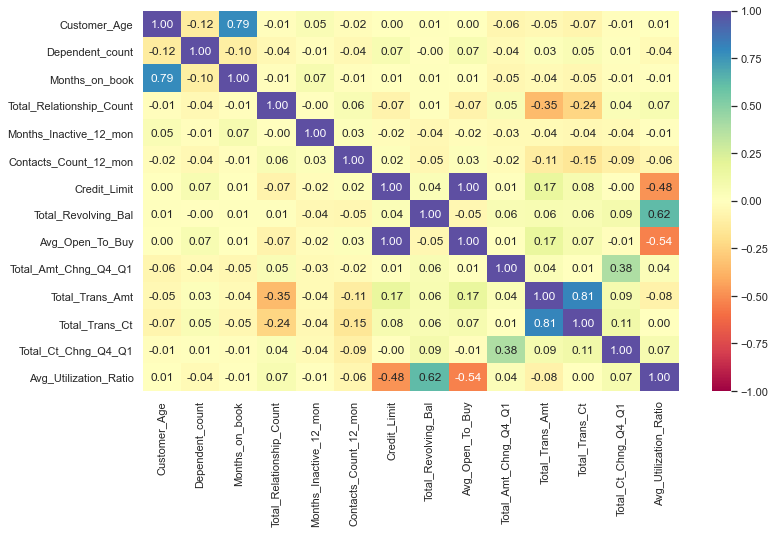

In [723]:
# plot correlation matrix
plt.figure(figsize=(12, 7))
sns.heatmap(
    df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

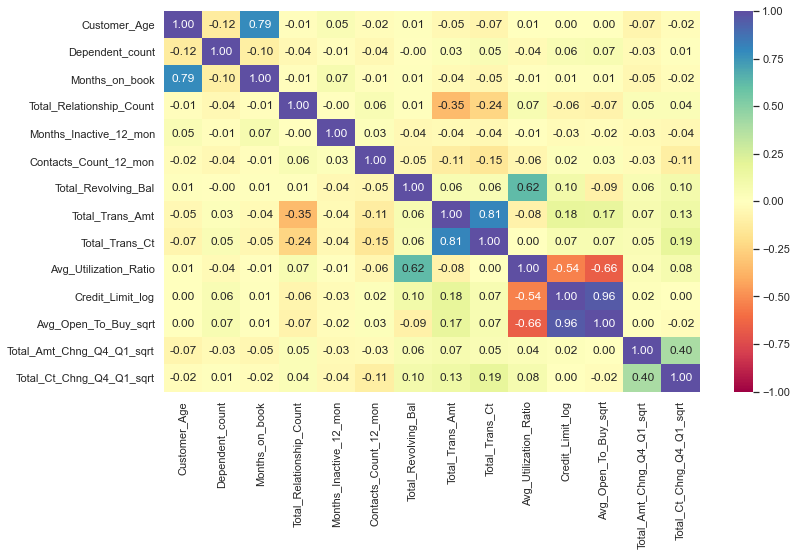

In [724]:
# plot correlation matrix
plt.figure(figsize=(12, 7))
sns.heatmap(
    processed_data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)
plt.show()

#### Pairplots and correlation observations
* `Avg_Open_To_Buy_sqrt` and `Credit_Limit_log` have correlation of 0.96. We will drop `Credit_Limit` and `Credit_Limit_log`
* `Total_Trans_Ct` and `Total_Trans_Amt` are strongly correlated but only at 0.81 - we will retain both
* `Months_On_Book` and `Customer_Age` have a correlation of 0.79; high but we will retain both variables
* Customers with a lower `Avg_Utilization_Ratio` are more likely to cancel their credit card
* Customers with lower `Total_Trans_Ct` are more likely to cancel their card
* Weaker correlations are present between 
    * `Avg_Utilization_Ratio` and `Total_Revolving_Balance`
    * `Avg_Utilization_Ratio` and `Avg_Open_To_Buy`

In [725]:
columns_to_drop.append('Credit_Limit')
processed_data.drop('Credit_Limit_log', axis=1, inplace=True)

##### "Total_Trans_Amt" vs "Attrition_Flag"])

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Trans_Amt'>

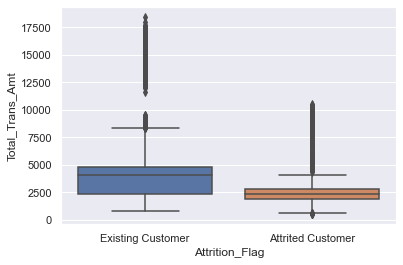

In [726]:
sns.boxplot(y=df["Total_Trans_Amt"], x=df["Attrition_Flag"])

Attrited customers tend to have a lower `Total_Trans_Amount`

#### "Avg_Open_To_Buy" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Avg_Open_To_Buy'>

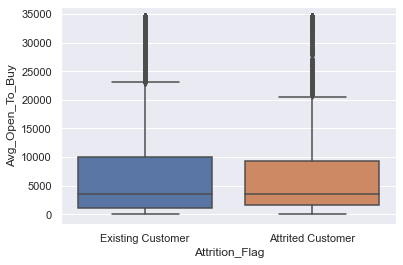

In [727]:
sns.boxplot(y=df["Avg_Open_To_Buy"], x=df["Attrition_Flag"])

Distributions look similar with minor differences in the IQRs.

##### "Avg_Utilization_Ratio" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Avg_Utilization_Ratio'>

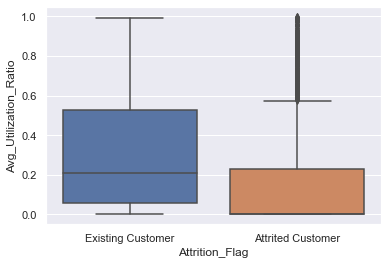

In [728]:
sns.boxplot(y=df["Avg_Utilization_Ratio"], x=df["Attrition_Flag"])

Attrited customers have significantly lower Avg_Utilization_Ratio.  There is some overlap with the outliers of attrited customers.

##### "Total_Ct_Chng_Q4_Q1" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Ct_Chng_Q4_Q1'>

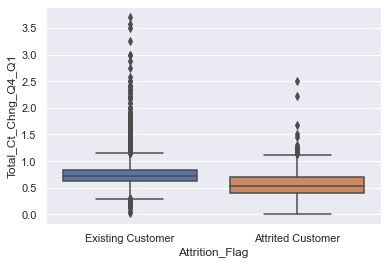

In [729]:
sns.boxplot(y=df["Total_Ct_Chng_Q4_Q1"], x=df["Attrition_Flag"])

Median and IQRs for attrited customer are lower suggesting customers who have declining card usage are more likely to cancel the card.

##### "Total_Amt_Chng_Q4_Q1" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Amt_Chng_Q4_Q1'>

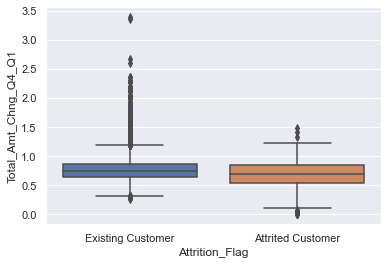

In [730]:
sns.boxplot(y=df["Total_Amt_Chng_Q4_Q1"], x=df["Attrition_Flag"])

Attrited customers tend to have lower ratio

##### "Total_Revolving_Bal" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Revolving_Bal'>

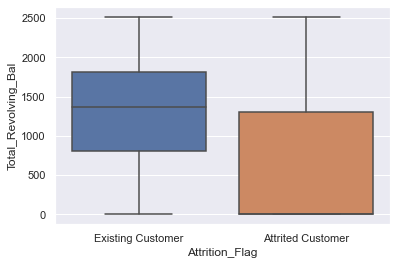

In [731]:
sns.boxplot(y=df["Total_Revolving_Bal"], x=df["Attrition_Flag"])

Attrited customers tend to have lower revolving balance.  However, the range of values are the same as for existing customers.

##### "Credit_Limit" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Credit_Limit'>

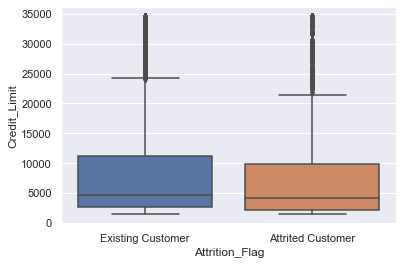

In [732]:
sns.boxplot(y=df["Credit_Limit"], x=df["Attrition_Flag"])

There are only slight differences between distributions.

##### "Contacts_Count_12_mon" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Contacts_Count_12_mon'>

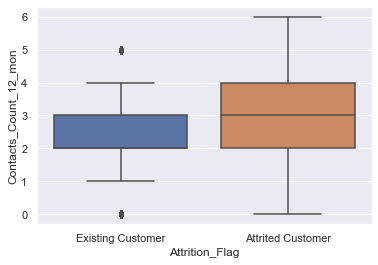

In [733]:
sns.boxplot(y=df["Contacts_Count_12_mon"], x=df["Attrition_Flag"])

Existing customers are mostly grouped between 1 and 4 contacts, while attrited customers are more distributed over the entire range (0 to 6).

##### "Months_Inactive_12_mon" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Months_Inactive_12_mon'>

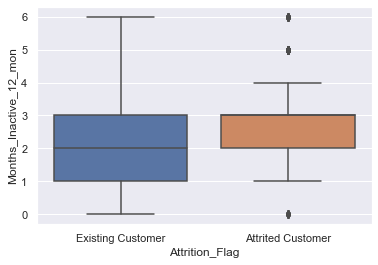

In [734]:
sns.boxplot(y=df["Months_Inactive_12_mon"], x=df["Attrition_Flag"])

The distribution for attrited customers is more concentrated between 1 and 4 months of inactivity.  This suggestes customers stop using the cards for a month or more before they drop it.

##### "Total_Relationship_Count" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Relationship_Count'>

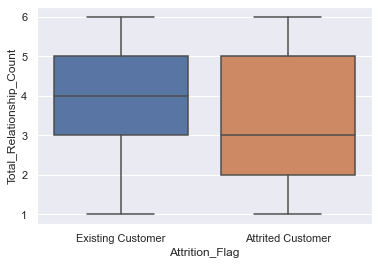

In [735]:
sns.boxplot(y=df["Total_Relationship_Count"], x=df["Attrition_Flag"])

Attrited customers tend to have or use less products than existing customers

##### "Months_on_book" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Months_on_book'>

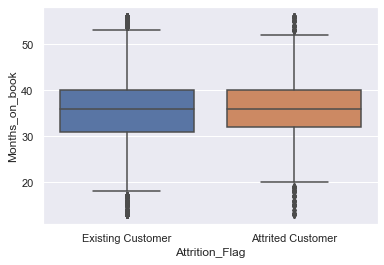

In [736]:
sns.boxplot(y=df["Months_on_book"], x=df["Attrition_Flag"])

There are only minor differences in `Months_on_book` distributions between attrited and existing customers.

##### "Dependent_count" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Dependent_count'>

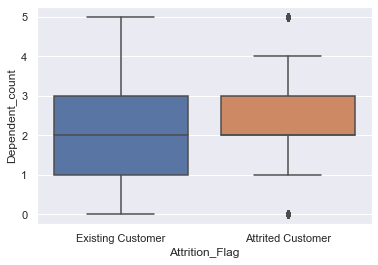

In [737]:
sns.boxplot(y=df["Dependent_count"], x=df["Attrition_Flag"])

Attrited customers are more concentrated between 1 and 4 dependents

##### "Customer_Age" vs "Attrition_Flag"

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Customer_Age'>

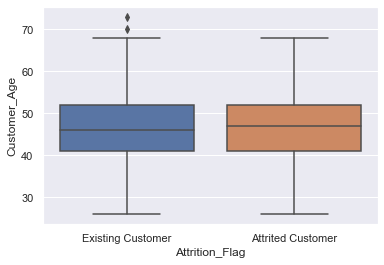

In [738]:
sns.boxplot(y=df["Customer_Age"], x=df["Attrition_Flag"])

Age does not seem to influence significantly whether a customer is attrited or not.

In [739]:
### Function to plot stacked bar charts for categorical columns
def stacked_plot(data, x, y):
    ''' Plot stacked bar charts.
        data = dataframe,
        x = categorical column to plot across x axis
        y = categorical column to stack
    '''
    sns.set()
    ## crosstab 
    tab1 = pd.crosstab(data[x],data[y],margins=True)
    print(tab1)
    print('-'*120)
    ## visualising the cross tab
    tab = pd.crosstab(data[x],data[y],normalize='index')
    tab.plot(kind='bar',stacked=True,figsize=(17,7))
    plt.legend(loc='lower left', frameon=False,)
    plt.legend(loc="upper left", bbox_to_anchor=(1,1))
    plt.show()

In [740]:
# for col in cat_cols:
#     get_ipython().set_next_input(f'stacked_plot(df,"{col}", "Attrition_Flag")')

##### "Card_Category" vs "Attrition_Flag"

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
Blue                         1519               7917   9436
Gold                           21                 95    116
Platinum                        5                 15     20
Silver                         82                473    555
All                          1627               8500  10127
------------------------------------------------------------------------------------------------------------------------


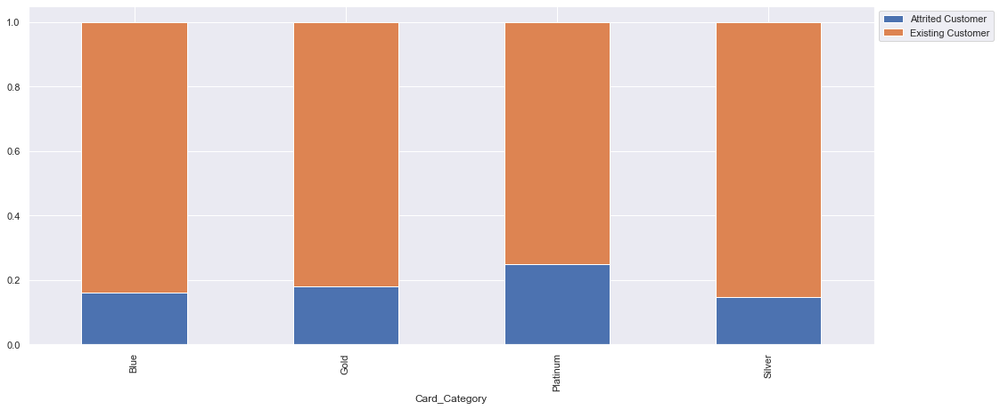

In [741]:
stacked_plot(df,"Card_Category", "Attrition_Flag")

Holders of Platinum cards seem more prone to cancel the credit card.  However, there is a very small number of customers with Platinum cards.

##### "Gender" vs "Attrition_Flag"

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
F                             930               4428   5358
M                             697               4072   4769
All                          1627               8500  10127
------------------------------------------------------------------------------------------------------------------------


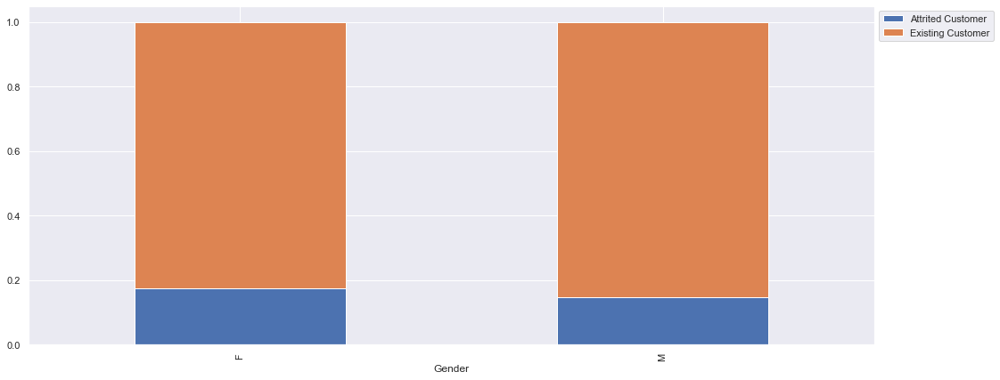

In [742]:
stacked_plot(df,"Gender", "Attrition_Flag")

Females are slightly more likely to drop the credit card.

##### "Education_Level" vs "Attrition_Flag"

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
College                        154                859  1013
Doctorate                       95                356   451
Graduate                       487               2641  3128
High School                    306               1707  2013
Post-Graduate                   92                424   516
Uneducated                     237               1250  1487
All                           1371               7237  8608
------------------------------------------------------------------------------------------------------------------------


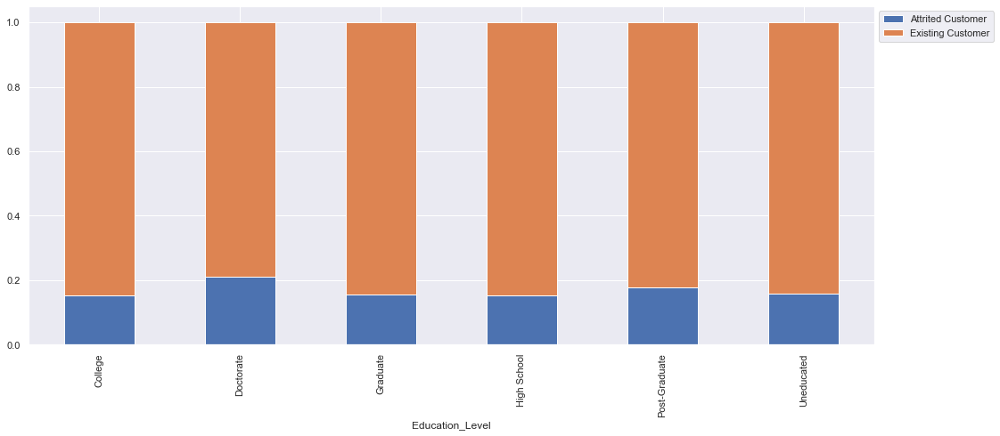

In [743]:
stacked_plot(df,"Education_Level", "Attrition_Flag")

Customes with education of 'Doctorate' are more likely to drop the credit card.

##### "Marital_Status", "Attrition_Flag"

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
Divorced                      121                627   748
Married                       709               3978  4687
Single                        668               3275  3943
All                          1498               7880  9378
------------------------------------------------------------------------------------------------------------------------


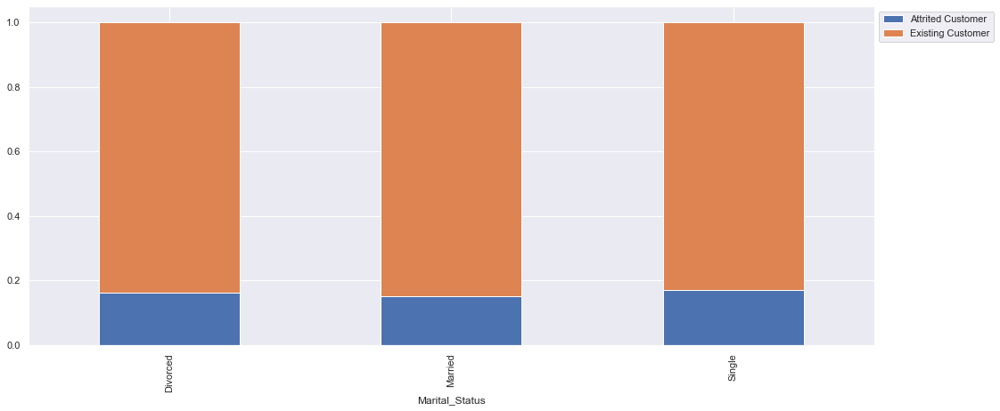

In [744]:
stacked_plot(df,"Marital_Status", "Attrition_Flag")

There are only slight differences between attrition rates according to marital status.

##### "Income_Category", "Attrition_Flag"

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
$120K +                        126                601    727
$40K - $60K                    271               1519   1790
$60K - $80K                    189               1213   1402
$80K - $120K                   242               1293   1535
Less than $40K                 612               2949   3561
abc                            187                925   1112
All                           1627               8500  10127
------------------------------------------------------------------------------------------------------------------------


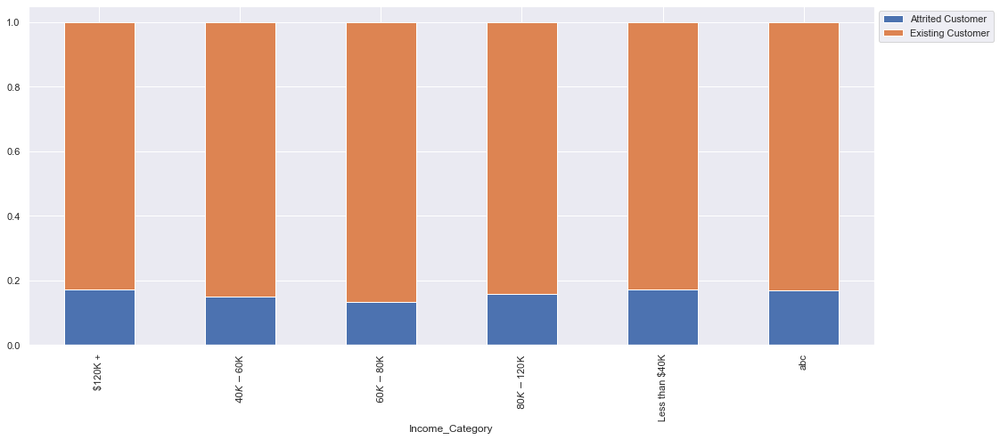

In [745]:
stacked_plot(df,"Income_Category", "Attrition_Flag")

Customers at the extremes of the income range ('Less than \\$40K' and '\$120K') tend to drop the card at slightly higher rates

### Data Preparation for Modeling

##### Income_Category invalid values

First we set 'abc' value to np.Nan

As the transformation doesn't depend on data distribution, we can do it before splitting the data.

In [746]:
# set 'abc' to NaN
def replace_str_w_nan (data, to_replace):
    return data.replace(to_replace=to_replace, value=np.nan)

abc_to_nan_transf = FunctionTransformer(replace_str_w_nan, kw_args={'to_replace':'abc'})

processed_data['Income_Category'] = abc_to_nan_transf.transform(processed_data['Income_Category'])

In [747]:
processed_data['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [748]:
processed_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Attrition_Flag             10127 non-null  object 
 1   Customer_Age               10127 non-null  int64  
 2   Gender                     10127 non-null  object 
 3   Dependent_count            10127 non-null  int64  
 4   Education_Level            8608 non-null   object 
 5   Marital_Status             9378 non-null   object 
 6   Income_Category            9015 non-null   object 
 7   Card_Category              10127 non-null  object 
 8   Months_on_book             10127 non-null  int64  
 9   Total_Relationship_Count   10127 non-null  int64  
 10  Months_Inactive_12_mon     10127 non-null  int64  
 11  Contacts_Count_12_mon      10127 non-null  int64  
 12  Total_Revolving_Bal        10127 non-null  int64  
 13  Total_Trans_Amt            10127 non-null  int

#### Split data

In [749]:
# Split target from features
X = processed_data.drop('Attrition_Flag', axis=1)
#X = pd.get_dummies(X)

y = processed_data['Attrition_Flag'].apply(lambda x: 1 if x == 'Attrited Customer' else 0)

# split out test
X_intermediate, X_test, y_intermediate, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

# split into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_intermediate, y_intermediate, test_size=0.25, random_state=1, stratify=y_intermediate)

print(X_train.shape, X_val.shape, X_test.shape)
print(f'Target train class ratio: {100*(y_train[y_train == 1]).count()/len(y_train)}')
print(f'Target val class ratio: {100*(y_val[y_val == 1]).count()/len(y_val)}')
print(f'Target test class ratio: {100*(y_test[y_test == 1]).count()/len(y_test)}')

(6075, 18) (2026, 18) (2026, 18)
Target train class ratio: 16.06584362139918
Target val class ratio: 16.090819348469893
Target test class ratio: 16.04146100691017


#### Missing values treatment

In [750]:
# check for nulls
print(X_train.isna().sum())

Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level              928
Marital_Status               457
Income_Category              654
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Total_Revolving_Bal            0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Avg_Utilization_Ratio          0
Avg_Open_To_Buy_sqrt           0
Total_Amt_Chng_Q4_Q1_sqrt      0
Total_Ct_Chng_Q4_Q1_sqrt       0
dtype: int64


In [751]:
# Check for nulls across data sets
print(X_train.isna().sum().sum())
print(X_val.isna().sum().sum())
print(X_test.isna().sum().sum())

2039
655
686


We will use an imputer to replace the null values with the most frequent occurence of the category i.e. the mode

In [752]:
# impute the most frequent value
imputer_mode = SimpleImputer(strategy='most_frequent')
imputer_mode.fit(X_train)

features = X_train.columns

# change back to dataframe
X_train = pd.DataFrame(imputer_mode.transform(X_train), columns=features)
X_val = pd.DataFrame(imputer_mode.transform(X_val), columns=features)
X_test = pd.DataFrame(imputer_mode.transform(X_test), columns=features)

# check for missing values
print(X_train.isna().sum().sum())
print(X_val.isna().sum().sum())
print(X_test.isna().sum().sum())

In [754]:
# create function to encode categorical variables
def encode_categories(dataframe, columns, drop_1st=False):
    '''
    applies pandas get_dummies() to the columns provided
    dataframe: the dataframe to add dummy variables to
    columns: list of columns to encode
    '''
    print("dataframe type:", type(dataframe))
    dataframe.info()
    print(columns)
    df = pd.get_dummies(dataframe, columns=columns, drop_first=drop_1st)
    return df.astype('float64')

# remove the target from the list of columns
cols_to_dummies = cat_cols.drop('Attrition_Flag')

# create transformer
dummies_transf = FunctionTransformer(encode_categories, 
                                     kw_args={'columns' : cols_to_dummies})

In [755]:
# fit the transformer on the train data
dummies_transf.fit(X_train)

# transform all the data sets
X_train = dummies_transf.transform(X_train)
X_val = dummies_transf.transform(X_val)
X_test = dummies_transf.transform(X_test)

dataframe type: <class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6075 entries, 0 to 6074
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Customer_Age               6075 non-null   object
 1   Gender                     6075 non-null   object
 2   Dependent_count            6075 non-null   object
 3   Education_Level            6075 non-null   object
 4   Marital_Status             6075 non-null   object
 5   Income_Category            6075 non-null   object
 6   Card_Category              6075 non-null   object
 7   Months_on_book             6075 non-null   object
 8   Total_Relationship_Count   6075 non-null   object
 9   Months_Inactive_12_mon     6075 non-null   object
 10  Contacts_Count_12_mon      6075 non-null   object
 11  Total_Revolving_Bal        6075 non-null   object
 12  Total_Trans_Amt            6075 non-null   object
 13  Total_Tra

### Models building

#### Model performance metrics
* False Positive (FP) predictions: the model predicts the customer will attrite but the customer doesn't.  
    Result in wasted resources and additional costs in retaining the customer.
* False Negative (FN) predictions: the model predicts the customer will retain the credit card but the customer does cancel the credit card.  
    The customer is not engaged and cancels the cards which is what we are trying to prevent in the first place.
    
We consider False Negatives to have a higher impact and therefore we will optimize Recall

##### Utilities functions 

In [756]:
def get_metrics_score(model,train,val,train_y,val_y,threshold=0.5,print_values=True,roc=False):
    '''
    Function to calculate different metric scores of the model - Accuracy, Recall, Precision, and F1 score
    model: classifier to predict values of X
    train, val: Independent features
    train_y,val_y: Dependent variable
    threshold: thresold for classifiying the observation as 1
    flag: If the flag is set to True then only the print statements showing different will be displayed. 
        The default value is set to True.
    roc: If the roc is set to True then only roc score will be displayed. The default value is set to False.
    '''
    # defining an empty list to store train and test results
    
    score_list=[] 
    
#    pred_train = (model.predict_proba(train)[:,1]>threshold)
#    pred_val = (model.predict_proba(val)[:,1]>threshold)

    pred_train = model.predict(train)
    pred_val = model.predict(val)

    pred_train = np.round(pred_train)
    pred_val = np.round(pred_val)
    
    train_acc = metrics.accuracy_score(pred_train,train_y)
    val_acc = metrics.accuracy_score(pred_val,val_y)
    
    train_recall = metrics.recall_score(train_y,pred_train)
    val_recall = metrics.recall_score(val_y,pred_val)
    
    train_precision = metrics.precision_score(train_y,pred_train)
    val_precision = metrics.precision_score(val_y,pred_val)
    
    train_f1 = metrics.f1_score(train_y,pred_train)
    val_f1 = metrics.f1_score(val_y,pred_val)
    
    
    score_list.extend((train_acc,val_acc,train_recall,val_recall,train_precision,val_precision,train_f1,val_f1))
    
    if print_values == True: 
        print("Accuracy - training      : ", train_acc)
        print("Accuracy - val           : ", val_acc)
        print("Recall - training        : ", train_recall)
        print("Recall - val             : ", val_recall)
        print("Precision - training     : ", train_precision)
        print("Precision - val          : ", val_precision)
        print("F1 - training            : ", train_f1)
        print("F1 - val                 : ", val_f1)
   
    if roc == True:
        pred_train_prob = model.predict_proba(train)[:,1]
        pred_val_prob = model.predict_proba(val)[:,1]
        print("ROC-AUC Score - training : ", metrics.roc_auc_score(train_y,pred_train))
        print("ROC-AUC Score - val      : ", metrics.roc_auc_score(val_y,pred_val))
    
    return score_list # returning the list with train and test scores

In [757]:
def plot_confusion_matrix(model, X, y_actual, threshold=0.5):
    '''Plot confusion matrix from model, X and y_actual.
    '''
    y_predict = model.predict(X)
#    y_predict = (model.predict_proba(X)[:,1]>threshold)
    cm = metrics.confusion_matrix(y_actual, y_predict)
    # print(cm.flatten())
    # https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html
    TN = cm[0,0]
    FP = cm[0,1]
    FN = cm[1,0]
    TP = cm[1,1]
    # print(f'TN:{TN}, FN:{FN}, TP:{TP}, FP:{FP}')
    accuracy  = (TP + TN) / (TN+FN+TP+FP) 
    precision = TP / (TP + FP)
    recall    = TP / (TP + FN)
    f1_score  = 2 * precision * recall / (precision + recall)
    scores = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(accuracy,precision,recall,f1_score)
    df_cm = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    group_names = ['TN', 'FP','FN','TP']
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    
    sns.heatmap(df_cm, annot=labels, fmt='', cmap='Spectral')
    print(scores)

#### Define six models and train them on the training data

In [758]:
models = [] # holds models to be trained
model_names = []
cv_scores = []  # holds cross-validation score for each model
val_scores = []  # validation set score

models.append(('Decision Tree', DecisionTreeClassifier(random_state=1)))
models.append(('Random Forest', RandomForestClassifier(random_state=1)))
models.append(('Adaboost', AdaBoostClassifier(random_state=1)))
models.append(('Gradient Boost', GradientBoostingClassifier(random_state=1)))
models.append(('Logistic Reg', LogisticRegression(random_state=1)))
models.append(('XGBoost', XGBClassifier(random_state=1, eval_metric='logloss')))

# Use recall to evaluate model metrics
scorer = metrics.make_scorer(metrics.recall_score)
splits = 5  # cross-validation folds

kfold = StratifiedKFold(n_splits=splits, random_state=1, shuffle=True)

for name, clf in models:
    model_names.append(name)
    start_time = time.time()
    print(f'------------\nModel {name} START at {time.ctime()}')
    
    score = cross_val_score(estimator=clf, X=X_train, y=y_train, scoring=scorer, cv=kfold)
    cv_scores.append(score)
    print('> Avg. Score:(train)',np.mean(score), 'CV scores:',score,)
    clf.fit(X_train, y_train)
    
    val_score = metrics.recall_score(y_val, clf.predict(X_val))
    val_scores.append(val_score)
    print('> Validation recall:', val_score)
    
    print(f'Model {name} END at {time.ctime()}\nElapsed: {time.time() - start_time}')


------------
Model Decision Tree START at Fri Aug  6 18:20:12 2021
> Avg. Score:(train) 0.7776556776556776 CV scores: [0.73846154 0.8        0.74358974 0.82051282 0.78571429]
> Validation recall: 0.8220858895705522
Model Decision Tree END at Fri Aug  6 18:20:12 2021
Elapsed: 0.36699938774108887
------------
Model Random Forest START at Fri Aug  6 18:20:12 2021
> Avg. Score:(train) 0.7274515960230247 CV scores: [0.72820513 0.74871795 0.72307692 0.7025641  0.73469388]
> Validation recall: 0.7760736196319018
Model Random Forest END at Fri Aug  6 18:20:16 2021
Elapsed: 4.104152679443359
------------
Model Adaboost START at Fri Aug  6 18:20:16 2021
> Avg. Score:(train) 0.8165567765567765 CV scores: [0.79487179 0.82051282 0.81025641 0.8        0.85714286]
> Validation recall: 0.852760736196319
Model Adaboost END at Fri Aug  6 18:20:19 2021
Elapsed: 2.345597982406616
------------
Model Gradient Boost START at Fri Aug  6 18:20:19 2021
> Avg. Score:(train) 0.8175876504447934 CV scores: [0.78461

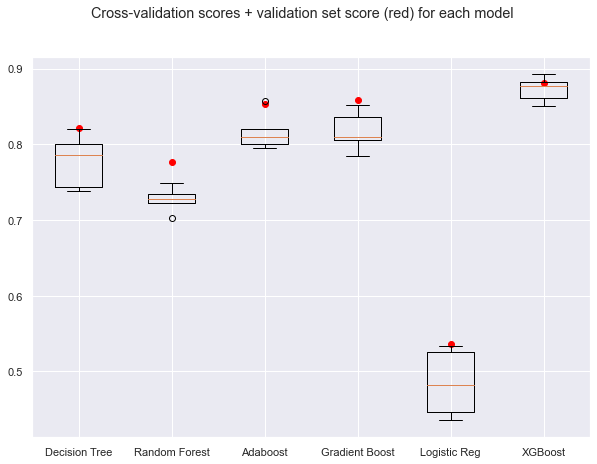

In [759]:
fig = plt.figure(figsize=(10,7))
color='red'
fig.suptitle(f'Cross-validation scores + validation set score ({color}) for each model')
ax = fig.add_subplot(111)
plt.boxplot(cv_scores, positions=range(0,len(model_names)));
plt.scatter(y=val_scores, x=model_names, marker='o', c=color)
ax.set_xticklabels(model_names);
plt.show()

* The best performing models for cross-validated recall are XGBoost, Gradient Boost, Adaboost  
* Best models for recall against the _validation_ set are XGBoost, Gradient Boost and Adaboost
* We will tune Adaboost, Gradient Boost and XGBoost using randomized search

#### Hyperparameters tuning

We will tune only the top three models: XGBoost, Gradient Boost, Adaboost

##### Adaboost

In [760]:
# get instance of classifier
adaboost_clf_tuned = AdaBoostClassifier(random_state=1)

# hyperparameters search space
parameters = {
    'n_estimators': np.arange(25, 100, 5),
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5, 0.1],
    'base_estimator': [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ]
}

start_time = time.time()
print(f'------------\nModel "Adaboost Tuned" START at {time.ctime()}')

# instance of random search
random_obj = RandomizedSearchCV(estimator=adaboost_clf_tuned, 
                                  param_distributions=parameters,
                                 n_iter = 50,
                                 scoring=scorer,
                                 cv=5,
                                 random_state=1)

# run search
random_obj.fit(X_train, y_train)

# get best estimator
adaboost_clf_tuned = random_obj.best_estimator_
# fit against train data set
adaboost_clf_tuned.fit(X_train, y_train)

# ge metrics
adaboost_tuned_scores = get_metrics_score(adaboost_clf_tuned, X_train, X_val, y_train, y_val)

print(f'Model "Adaboost Tuned" END at {time.ctime()}\nElapsed: {time.time() - start_time}')

------------
Model "Adaboost Tuned" START at Fri Aug  6 18:20:30 2021
Accuracy - training      :  0.9998353909465021
Accuracy - val           :  0.9644619940769991
Recall - training        :  1.0
Recall - val             :  0.8558282208588958
Precision - training     :  0.9989764585465711
Precision - val          :  0.9177631578947368
F1 - training            :  0.9994879672299026
F1 - val                 :  0.8857142857142857
Model "Adaboost Tuned" END at Fri Aug  6 18:23:56 2021
Elapsed: 205.10476756095886


Performance of the tuned Adaboost for validation is similar to the model with default parameters.

AdaBoost tuned - confusion matrix - validation set


Accuracy=0.964
Precision=0.918
Recall=0.856
F1 Score=0.886


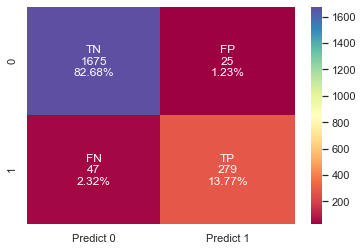

In [761]:
print('AdaBoost tuned - confusion matrix - validation set')
plot_confusion_matrix(adaboost_clf_tuned,X_val,y_val)

##### Gradient boost tuning

In [762]:
# get instance of classifier
gradboost_tuned = GradientBoostingClassifier(random_state=1)

# get gradient boost hyperparameters
# gradboost_tuned.get_params().keys()
# dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 
#'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 
#'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 
#'n_estimators', 'n_iter_no_change', 'presort', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

# hyperparameters space
parameters = {
    'n_estimators' : np.arange(40, 140, 20),
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3, 0.4],
    'max_depth': [2,3,4,5],
    'min_impurity_decrease': [0.1, 0.01, 0.001]
}

# get grid instance
random_obj = RandomizedSearchCV(gradboost_tuned, 
                            param_distributions=parameters,
                            n_iter=50,
                            scoring=scorer,
                            cv=5,
                           n_jobs=1,
                               random_state=1)
start_time = time.time()
print(f'------------\nModel "Gradient Boost Tuned" START at {time.ctime()}')

# run search
random_obj.fit(X_train, y_train)

# get best model
gradboost_tuned = random_obj.best_estimator_

# fit the model against train data
gradboost_tuned.fit(X_train, y_train)

# get scores
gradboost_tuned_scores = get_metrics_score(gradboost_tuned, X_train, X_val, y_train, y_val)

print(f'Model "Gradient Boost Tuned" END at {time.ctime()}\nElapsed: {time.time() - start_time}')

------------
Model "Gradient Boost Tuned" START at Fri Aug  6 18:23:56 2021
Accuracy - training      :  0.9967078189300411
Accuracy - val           :  0.9689042448173741
Recall - training        :  0.9866803278688525
Recall - val             :  0.8773006134969326
Precision - training     :  0.9927835051546392
Precision - val          :  0.9255663430420712
F1 - training            :  0.9897225077081193
F1 - val                 :  0.9007874015748031
Model "Gradient Boost Tuned" END at Fri Aug  6 18:27:39 2021
Elapsed: 222.48415660858154


Performance after tuning is now at 0.877 for recall and accuracy at 0.969

Gradient boost tuned - confusion matrix - validation set


Accuracy=0.969
Precision=0.926
Recall=0.877
F1 Score=0.901


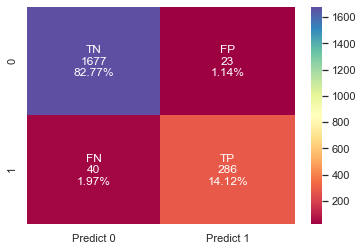

In [763]:
print('Gradient boost tuned - confusion matrix - validation set')
plot_confusion_matrix(gradboost_tuned, X_val, y_val)

##### XGBoost tuning

In [764]:
# get instance of classifier
xgboost_tuned = XGBClassifier(random_state=1, eval_metric='logloss')

# hyperparameters space
parameters = {
    'n_estimators' : np.arange(40, 140, 20),
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3, 0.4],
    'gamma': [0,1,3],
    'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1],
    'colsample_bylevel':[0.5, 0.6, 0.7, 0.8, 0.9, 1],
}

# get grid instance
random_obj = RandomizedSearchCV(xgboost_tuned, 
                            param_distributions=parameters,
                            n_iter=50,
                            scoring=scorer,
                            cv=5,
                           n_jobs=1,
                               random_state=1)
start_time = time.time()
print(f'------------\nModel "xgboost Tuned" START at {time.ctime()}')

# run search
random_obj.fit(X_train, y_train)

# get best model
xgboost_tuned = random_obj.best_estimator_

# fit the model against train data
xgboost_tuned.fit(X_train, y_train)

# get scores
xgboost_tuned_scores = get_metrics_score(xgboost_tuned, X_train, X_val, y_train, y_val)

print(f'Model "XGBoost Tuned" END at {time.ctime()}\nElapsed: {time.time() - start_time}')

------------
Model "xgboost Tuned" START at Fri Aug  6 18:27:39 2021
Accuracy - training      :  0.9980246913580247
Accuracy - val           :  0.972852912142152
Recall - training        :  0.9948770491803278
Recall - val             :  0.8987730061349694
Precision - training     :  0.9928425357873211
Precision - val          :  0.9301587301587302
F1 - training            :  0.9938587512794269
F1 - val                 :  0.9141965678627144
Model "XGBoost Tuned" END at Fri Aug  6 18:29:10 2021
Elapsed: 90.48558688163757


Model performance is slightly higher (recall: 0.880 with CV vs 0.899 tuned)

Accuracy is high at 0.973.

XGBoost tuned - confusion matrix - validation set


Accuracy=0.973
Precision=0.930
Recall=0.899
F1 Score=0.914


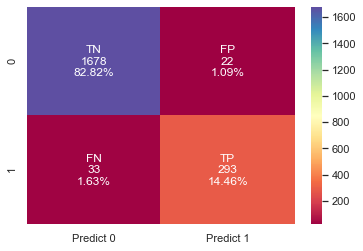

In [765]:
print('XGBoost tuned - confusion matrix - validation set')
plot_confusion_matrix(xgboost_tuned, X_val, y_val)

#### Models comparison

In [766]:
# scores
indexes = ['Accuracy train','Accuracy val','Recall train','Recall val','Precision train','Precision val','F1 train','F1 val']
models_scores_df = pd.DataFrame(np.transpose(adaboost_tuned_scores), columns=['AdaBoost Tuned'], index=indexes)
models_scores_df['GradBoost Tuned'] = pd.Series(gradboost_tuned_scores, index=indexes)
models_scores_df['XGBoost Tuned'] = pd.Series(xgboost_tuned_scores, index=indexes)

models_scores_df.T.sort_values(by='Recall val', ascending=False)

,Accuracy train,Accuracy val,Recall train,Recall val,Precision train,Precision val,F1 train,F1 val
XGBoost Tuned,0.998,0.973,0.995,0.899,0.993,0.930,0.994,0.914
GradBoost Tuned,0.997,0.969,0.987,0.877,0.993,0.926,0.990,0.901
AdaBoost Tuned,1.000,0.964,1.000,0.856,0.999,0.918,0.999,0.886


The best recall is from the XGBoost tuned model with 0.899 for validation.  For that model accuracy is high as well with 0.973

#### Data oversampling
We will now oversample the data to see if we can improve the models performance by balancing the target class.

In [767]:
# current counts of target label
print("Before UpSampling, counts of label 'Attrited Customer': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'Current Customer': {} \n".format(sum(y_train == 0)))

Before UpSampling, counts of label 'Attrited Customer': 976
Before UpSampling, counts of label 'Current Customer': 5099 



In [768]:
# Use SMOTE to oversample
sm_oversampler = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_oversmpl, y_train_oversmpl = sm_oversampler.fit_resample(X_train, y_train)

# post oversample counts of target label
print("After UpSampling, counts of label 'Attrited Customer': {}".format(sum(y_train_oversmpl == 1)))
print("After UpSampling, counts of label 'Current Customer': {} \n".format(sum(y_train_oversmpl == 0)))
print(f"Shape of oversample dataframes: X: {X_train_oversmpl.shape}, y: {y_train_oversmpl.shape}")

After UpSampling, counts of label 'Attrited Customer': 5099
After UpSampling, counts of label 'Current Customer': 5099 

Shape of oversample dataframes: X: (10198, 33), y: (10198,)


#### Fit tuned and default models to oversampled data

In [769]:
# fit adaboost tuned
adaboost_clf_tuned.fit(X_train_oversmpl, y_train_oversmpl)
print("\nTuned Adaboost scores (fit on oversampled train)")
adaboost_tuned_oversampl_scores = get_metrics_score(adaboost_clf_tuned, X_train_oversmpl, X_val, y_train_oversmpl, y_val)

# fit default adaboost
adaboost_default = AdaBoostClassifier(random_state=1)
adaboost_default.fit(X_train_oversmpl, y_train_oversmpl)
print("\nDefault Adaboost scores (fit on oversampled train)")
adaboost_default_oversampl_scores = get_metrics_score(adaboost_default, X_train_oversmpl, X_val, y_train_oversmpl, y_val)


Tuned Adaboost scores (fit on oversampled train)
Accuracy - training      :  0.999901941557168
Accuracy - val           :  0.9679170779861797
Recall - training        :  1.0
Recall - val             :  0.8987730061349694
Precision - training     :  0.9998039215686274
Precision - val          :  0.9015384615384615
F1 - training            :  0.9999019511716835
F1 - val                 :  0.9001536098310291

Default Adaboost scores (fit on oversampled train)
Accuracy - training      :  0.9704844087075897
Accuracy - val           :  0.9540967423494571
Recall - training        :  0.9737203373210433
Recall - val             :  0.8865030674846626
Precision - training     :  0.9674590802805924
Precision - val          :  0.8376811594202899
F1 - training            :  0.9705796109862184
F1 - val                 :  0.8614008941877794


In [770]:
# fit tuned gradient boost
gradboost_tuned.fit(X_train_oversmpl, y_train_oversmpl)
print("\nTuned Gradientboost scores (fit on oversampled train)")
gradboost_tuned_oversampl_scores = get_metrics_score(gradboost_tuned, X_train_oversmpl, X_val, y_train_oversmpl, y_val)

# fit gradient boost
gradboost_default = GradientBoostingClassifier(random_state=1)
gradboost_default.fit(X_train_oversmpl, y_train_oversmpl)
print("\nDefault gradientboost scores (fit on oversampled train)")
gradboost_default_oversampl_scores = get_metrics_score(gradboost_default, X_train_oversmpl, X_val, y_train_oversmpl, y_val)


Tuned Gradientboost scores (fit on oversampled train)
Accuracy - training      :  0.9953912531868994
Accuracy - val           :  0.9659427443237907
Recall - training        :  0.9954893116297313
Recall - val             :  0.8895705521472392
Precision - training     :  0.9952941176470588
Precision - val          :  0.8978328173374613
F1 - training            :  0.9953917050691243
F1 - val                 :  0.8936825885978429

Default gradientboost scores (fit on oversampled train)
Accuracy - training      :  0.982349480290253
Accuracy - val           :  0.9619940769990128
Recall - training        :  0.9817611296332615
Recall - val             :  0.8803680981595092
Precision - training     :  0.9829177302179462
Precision - val          :  0.8830769230769231
F1 - training            :  0.9823390894819466
F1 - val                 :  0.8817204301075269


In [771]:
# fit xgboost tuned
xgboost_tuned.fit(X_train_oversmpl, y_train_oversmpl)
print("\nTuned xgboost scores (fit on oversampled train)")
xgboost_tuned_oversmpl_scores = get_metrics_score(xgboost_tuned, X_train_oversmpl, X_val, y_train_oversmpl, y_val)

# fit default xgboost
xgboost_default = XGBClassifier(random_state=1, eval_metric='logloss')
xgboost_default.fit(X_train_oversmpl, y_train_oversmpl)
print("\nDefault xgboost scores (fit on oversampled train)")
xgboost_default_oversmpl_scores = get_metrics_score(xgboost_default, X_train_oversmpl, X_val, y_train_oversmpl, y_val)


Tuned xgboost scores (fit on oversampled train)
Accuracy - training      :  0.9989213571288488
Accuracy - val           :  0.9738400789733465
Recall - training        :  0.9992155324573446
Recall - val             :  0.9079754601226994
Precision - training     :  0.9986279890239121
Precision - val          :  0.9278996865203761
F1 - training            :  0.9989216743456523
F1 - val                 :  0.917829457364341

Default xgboost scores (fit on oversampled train)
Accuracy - training      :  1.0
Accuracy - val           :  0.9708785784797631
Recall - training        :  1.0
Recall - val             :  0.8987730061349694
Precision - training     :  1.0
Precision - val          :  0.9184952978056427
F1 - training            :  1.0
F1 - val                 :  0.9085271317829456


In [772]:
# add scores to scores dataframe
models_scores_df['AdaBoost Tuned overs'] = pd.Series(adaboost_tuned_oversampl_scores, index=indexes)
models_scores_df['Adaboost Default overs'] = pd.Series(adaboost_default_oversampl_scores, index=indexes)
models_scores_df['GradBoost Tuned overs'] = pd.Series(gradboost_tuned_oversampl_scores, index=indexes)
models_scores_df['GradBoost Default overs'] = pd.Series(gradboost_default_oversampl_scores, index=indexes)
models_scores_df['XGBoost Tuned overs'] = pd.Series(xgboost_tuned_oversmpl_scores, index=indexes)
models_scores_df['XGBoost Default overs'] = pd.Series(xgboost_default_oversmpl_scores, index=indexes)

In [773]:
models_scores_df.T.sort_values(by='Recall val', ascending=False)

,Accuracy train,Accuracy val,Recall train,Recall val,Precision train,Precision val,F1 train,F1 val
XGBoost Tuned overs,0.999,0.974,0.999,0.908,0.999,0.928,0.999,0.918
XGBoost Tuned,0.998,0.973,0.995,0.899,0.993,0.930,0.994,0.914
AdaBoost Tuned overs,1.000,0.968,1.000,0.899,1.000,0.902,1.000,0.900
XGBoost Default overs,1.000,0.971,1.000,0.899,1.000,0.918,1.000,0.909
GradBoost Tuned overs,0.995,0.966,0.995,0.890,0.995,0.898,0.995,0.894
Adaboost Default overs,0.970,0.954,0.974,0.887,0.967,0.838,0.971,0.861
GradBoost Default overs,0.982,0.962,0.982,0.880,0.983,0.883,0.982,0.882
GradBoost Tuned,0.997,0.969,0.987,0.877,0.993,0.926,0.990,0.901
AdaBoost Tuned,1.000,0.964,1.000,0.856,0.999,0.918,0.999,0.886


* The tuned XGBoost model fit on oversampled data has the highest Recall on validation (.908).  
    It also has the highest accuracy.
* The tuned XGBoost, tuned Adaboost fit on overs and default XGBoost fit on overs all reached a recall of 0.899

#### Train models on undersampled data

In [774]:
# current counts of target label
print("Before undersampling, counts of label 'Attrited Customer': {}".format(sum(y_train == 1)))
print("Before undersampling, counts of label 'Current Customer': {} \n".format(sum(y_train == 0)))

Before undersampling, counts of label 'Attrited Customer': 976
Before undersampling, counts of label 'Current Customer': 5099 



##### Undersample the data

In [775]:
# get instance of undersampler
undersampler = RandomUnderSampler(sampling_strategy='majority', random_state=1, replacement=False)

# resample the data
X_train_undersmpl, y_train_undersmpl = undersampler.fit_resample(X_train, y_train)

# post oversample counts of target label
print("After undersampling, counts of label 'Attrited Customer': {}".format(sum(y_train_undersmpl == 1)))
print("After undersampling, counts of label 'Current Customer': {} \n".format(sum(y_train_undersmpl == 0)))
print(f"Shape of oversample dataframes: X: {X_train_undersmpl.shape}, y: {y_train_undersmpl.shape}")

After undersampling, counts of label 'Attrited Customer': 976
After undersampling, counts of label 'Current Customer': 976 

Shape of oversample dataframes: X: (1952, 33), y: (1952,)


In [776]:
# fit adaboost tuned
adaboost_clf_tuned.fit(X_train_undersmpl, y_train_undersmpl)
print("\nTuned Adaboost scores (fit on undersampled train)")
adaboost_tuned_undersampl_scores = get_metrics_score(adaboost_clf_tuned, X_train_undersmpl, X_val, y_train_undersmpl, y_val)

# fit default adaboost
adaboost_default = AdaBoostClassifier(random_state=1)
adaboost_default.fit(X_train_undersmpl, y_train_undersmpl)
print("\nDefault Adaboost scores (fit on undersampled train)")
adaboost_default_undersmpl_scores = get_metrics_score(adaboost_default, X_train_undersmpl, X_val, y_train_undersmpl, y_val)


Tuned Adaboost scores (fit on undersampled train)
Accuracy - training      :  1.0
Accuracy - val           :  0.9461994076999013
Recall - training        :  1.0
Recall - val             :  0.9662576687116564
Precision - training     :  1.0
Precision - val          :  0.7627118644067796
F1 - training            :  1.0
F1 - val                 :  0.8525033829499323

Default Adaboost scores (fit on undersampled train)
Accuracy - training      :  0.9492827868852459
Accuracy - val           :  0.930898321816387
Recall - training        :  0.9549180327868853
Recall - val             :  0.9539877300613497
Precision - training     :  0.9442755825734549
Precision - val          :  0.713302752293578
F1 - training            :  0.9495669893020886
F1 - val                 :  0.8162729658792651


In [777]:
# fit tuned gradient boost
gradboost_tuned.fit(X_train_undersmpl, y_train_undersmpl)
print("\nTuned Gradientboost scores (fit on undersampled train)")
gradboost_tuned_undersmpl_scores = get_metrics_score(gradboost_tuned, X_train_undersmpl, X_val, y_train_undersmpl, y_val)

# fit gradient boost
gradboost_default = GradientBoostingClassifier(random_state=1)
gradboost_default.fit(X_train_undersmpl, y_train_undersmpl)
print("\nDefault gradientboost scores (fit on undersampled train)")
gradboost_default_undersmpl_scores = get_metrics_score(gradboost_default, X_train_undersmpl, X_val, y_train_undersmpl, y_val)


Tuned Gradientboost scores (fit on undersampled train)
Accuracy - training      :  1.0
Accuracy - val           :  0.9432379072063178
Recall - training        :  1.0
Recall - val             :  0.9662576687116564
Precision - training     :  1.0
Precision - val          :  0.7517899761336515
F1 - training            :  1.0
F1 - val                 :  0.8456375838926175

Default gradientboost scores (fit on undersampled train)
Accuracy - training      :  0.9743852459016393
Accuracy - val           :  0.9353405725567621
Recall - training        :  0.9805327868852459
Recall - val             :  0.9570552147239264
Precision - training     :  0.9686234817813765
Precision - val          :  0.7272727272727273
F1 - training            :  0.9745417515274949
F1 - val                 :  0.8264900662251656


In [778]:
# fit xgboost tuned
xgboost_tuned.fit(X_train_undersmpl, y_train_undersmpl)
print("\nTuned xgboost scores (fit on undersampled train)")
xgboost_tuned_undersmpl_scores = get_metrics_score(xgboost_tuned, X_train_undersmpl, X_val, y_train_undersmpl, y_val)

# fit default xgboost
xgboost_default = XGBClassifier(random_state=1, eval_metric='logloss')
xgboost_default.fit(X_train_undersmpl, y_train_undersmpl)
print("\nDefault xgboost scores (fit on undersampled train)")
xgboost_default_undersmpl_scores = get_metrics_score(xgboost_default, X_train_undersmpl, X_val, y_train_undersmpl, y_val)


Tuned xgboost scores (fit on undersampled train)
Accuracy - training      :  0.9979508196721312
Accuracy - val           :  0.9432379072063178
Recall - training        :  1.0
Recall - val             :  0.9662576687116564
Precision - training     :  0.9959183673469387
Precision - val          :  0.7517899761336515
F1 - training            :  0.9979550102249488
F1 - val                 :  0.8456375838926175

Default xgboost scores (fit on undersampled train)
Accuracy - training      :  1.0
Accuracy - val           :  0.9407699901283317
Recall - training        :  1.0
Recall - val             :  0.9631901840490797
Precision - training     :  1.0
Precision - val          :  0.7440758293838863
F1 - training            :  1.0
F1 - val                 :  0.839572192513369


#### Compare scores of models fit on undersampled data

In [779]:
# add scores to scores dataframe
models_scores_df['AdaBoost Tuned unders'] = pd.Series(adaboost_tuned_undersampl_scores, index=indexes)
models_scores_df['Adaboost Default unders'] = pd.Series(adaboost_default_undersmpl_scores, index=indexes)
models_scores_df['GradBoost Tuned unders'] = pd.Series(gradboost_tuned_undersmpl_scores, index=indexes)
models_scores_df['GradBoost Default unders'] = pd.Series(gradboost_default_undersmpl_scores, index=indexes)
models_scores_df['XGBoost Tuned unders'] = pd.Series(xgboost_tuned_undersmpl_scores, index=indexes)
models_scores_df['XGBoost Default unders'] = pd.Series(xgboost_default_undersmpl_scores, index=indexes)

In [780]:
models_scores_df.T.sort_values(by='Recall val', axis=0, ascending=False)

,Accuracy train,Accuracy val,Recall train,Recall val,Precision train,Precision val,F1 train,F1 val
AdaBoost Tuned unders,1.000,0.946,1.000,0.966,1.000,0.763,1.000,0.853
GradBoost Tuned unders,1.000,0.943,1.000,0.966,1.000,0.752,1.000,0.846
XGBoost Tuned unders,0.998,0.943,1.000,0.966,0.996,0.752,0.998,0.846
XGBoost Default unders,1.000,0.941,1.000,0.963,1.000,0.744,1.000,0.840
GradBoost Default unders,0.974,0.935,0.981,0.957,0.969,0.727,0.975,0.826
Adaboost Default unders,0.949,0.931,0.955,0.954,0.944,0.713,0.950,0.816
XGBoost Tuned overs,0.999,0.974,0.999,0.908,0.999,0.928,0.999,0.918
XGBoost Tuned,0.998,0.973,0.995,0.899,0.993,0.930,0.994,0.914
AdaBoost Tuned overs,1.000,0.968,1.000,0.899,1.000,0.902,1.000,0.900
XGBoost Default overs,1.000,0.971,1.000,0.899,1.000,0.918,1.000,0.909


* The best recall score for validation set is from the three tuned models fit on undersampled data.  
    All have a recall of 0.966 on validation set.

We will now assess the scores on test data set

##### Top three models performance on test data



Accuracy=0.941
Precision=0.741
Recall=0.975
F1 Score=0.842


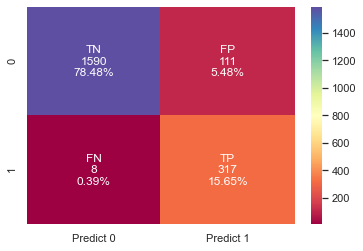

In [781]:
# adaboost performance on test
#y_test_predict_adaboost_tuned = adaboost_clf_tuned.predict(X_test)
plot_confusion_matrix(adaboost_clf_tuned, X_test, y_test)

Adaboost tuned: Recall on test data is 0.975, Accuracy is 0.941



Accuracy=0.944
Precision=0.755
Recall=0.966
F1 Score=0.848


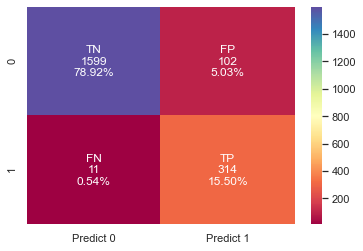

In [782]:
# tuned xgboost performance on test
plot_confusion_matrix(xgboost_tuned, X_test, y_test)

XGBoost Default: Recall on test data is 0.966, Accuracy is 0.944



Accuracy=0.939
Precision=0.740
Recall=0.954
F1 Score=0.833


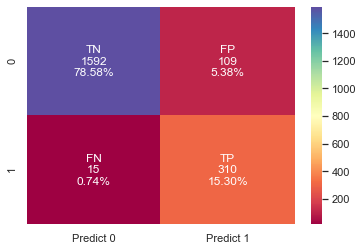

In [783]:
# tuned gradboost performance on test
plot_confusion_matrix(gradboost_tuned, X_test, y_test)

Default gradient boost: Recall 0.954, Accuracy 0.939

All the three top models meet the requirements of Recall > 0.95 and accuracy > 0.70

##### Features importance

We will use the best model (Adaboost) to assess the features importance

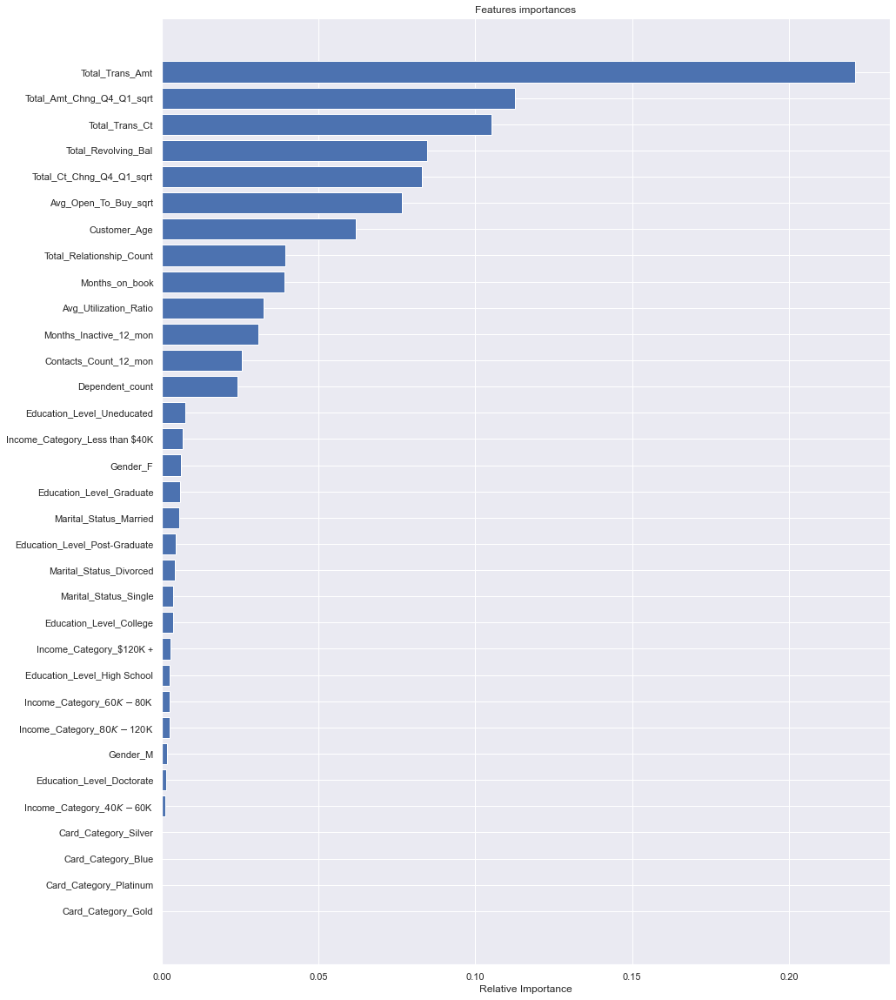

In [784]:
# get the feature importances
features_names = X_train.columns
importance = adaboost_clf_tuned.feature_importances_
sorted_indexes  = np.argsort(importance)

# plot sorted by importance
plt.figure(figsize=(15, 20))
plt.title('Features importances')
plt.barh(range(len(sorted_indexes)), importance[sorted_indexes], align='center')
plt.yticks(range(len(sorted_indexes)), [features_names[i] for i in sorted_indexes])
plt.xlabel('Relative Importance')
plt.show()

##### Features importance Observations
* `Total_Trans_Amt` is the most important feature
* `Total_Amt_Chng_Q4_Q1_sqrt` is the second most important feature
* `Total_Trans_Ct` and `Total_Revolving_Bal` are third and fourth respectively

### Build the model using a pipeline

We will use the tuned adaboost model to be used in the pipeline as it has the best performance on the test set.

In [785]:
# get the best model parameters
print(adaboost_clf_tuned.get_params)

<bound method BaseEstimator.get_params of AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3,
                                                         random_state=1),
                   learning_rate=0.5, n_estimators=90, random_state=1)>


In [786]:
print(f"Columns to drop: {columns_to_drop}")
print(f"Columns to log transform: {col_log_transform}")
print(f"Columns to sqrt transform: {col_sqrt_transf}")

Columns to drop: ['CLIENTNUM', 'Credit_Limit']
Columns to log transform: ['Credit_Limit']
Columns to sqrt transform: ['Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Ct_Chng_Q4_Q1']


As 'Credit_Limit' needs to be dropped there are no columns to transform with log.

In [787]:
# load the data and drop columns
pipe_df = pd.read_csv('BankChurners.csv')
pipe_df.drop(columns_to_drop, axis=1, inplace=True)

X = pipe_df.drop('Attrition_Flag', axis=1)
y = pipe_df['Attrition_Flag']

# split the data
X_pipe_train, X_pipe_test, y_pipe_train, y_pipe_test = train_test_split(X, y, 
                                                                        test_size=0.30,
                                                                        random_state=1,
                                                                        stratify=y)

In [788]:
print(f"Shape X_pipe_train: {X_pipe_train.shape}")
print(f"Shape y_pipe_train: {y_pipe_train.shape}")

Shape X_pipe_train: (7088, 18)
Shape y_pipe_train: (7088,)


##### Create transformers for preprocess the data

In [789]:
# function to get numerical indexes from dataframe to be used for indexing arrays
def get_col_indexes(dataframe, cols_list):
    indexes = []
    for col in cols_list:
        indexes.append(dataframe.columns.get_loc(col))
    return indexes

# creating a transformer for numerical variables, which will apply the sqrt transformer
numerical_features =  col_sqrt_transf
numeric_transformer = Pipeline(steps=[('sqrt scaling', sqrt_transf)])

# list of categorical columns
categorical_features = cols_to_dummies

# transform categorical by imputing values first and one hot encode them
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)

# combining categorical transformer and numerical transformer using a column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, get_indexes(X_pipe_train, X_pipe_train.columns)),
    ],
    remainder="passthrough",
)

##### Create pipeline

In [790]:
# create estimators using tuned Adaboost hyperparameters

# base estimator for Adaboost
dtree_base_estimator = DecisionTreeClassifier(max_depth=3, random_state=1)

# estimator for pipeline
adaboost_pipe_clf = AdaBoostClassifier(
            base_estimator=dtree_base_estimator,
            learning_rate=0.5, 
            n_estimators=90, 
            random_state=1)

# create the pipeline
adaboost_pipe = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('Adaboost', adaboost_pipe_clf)
    ],
    verbose=True)

# fit the pipeline to the train data
adaboost_pipe.fit(X_pipe_train, y_pipe_train)

[Pipeline] ...... (step 1 of 2) Processing preprocessor, total=   0.3s
[Pipeline] .......... (step 2 of 2) Processing Adaboost, total=   3.1s


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('sqrt '
                                                                   'scaling',
                                                                   FunctionTransformer(func=<ufunc 'sqrt'>))]),
                                                  ['Avg_Open_To_Buy',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Total_Ct_Chng_Q4_Q1']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                           

#### Pipeline performance on test set created for pipeline 



Accuracy=0.903
Precision=0.928
Recall=0.959
F1 Score=0.943


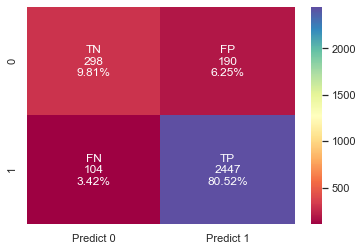

In [791]:
# predict using pipeline
pipeline_y_predict_test = adaboost_pipe.predict(X_pipe_test)

# plot confusion matrix
plot_confusion_matrix(adaboost_pipe,X_pipe_test,y_pipe_test)

#### Pipeline Performance Observations
* The pipeline performance reached the requirements of Recall > 0.95 (0.959) and Accuracy > 0.70 (0.903)

## Summary and Business Recommendations
### Observations from data analysis and features importances
* Customers with lower total transaction amounts are at higher risk of cancelling the card and should be targeted for retention initiatives
* Customers with lower total transaction counts are at higher risk of cancelling the card and should be targeted for retention initiatives
* Customers with lower revolving balances have a higher risk of cancelling the card
* Customers with decreasing transaction amounts quarter over quarter have a higher risk of canceling the card
* Customers with decreasing transaction counts quarter over quarter have a higher risk of cancelling the card

### Recommendations
Customers at risk should be targeted with incentives to increase purchases with the credit card.

Customers at risk should be targeted with incentives to raise the average revolving balance.

* Offer discounts at selected retailer for purchases made with the credit card
* Rebates or point offered on purchases made with the credit card
* Sustained messaging with ongoing promotions and active discounts to remind the customer of the benefits of using the card
* Offer incentives to transfer balances from a competitor credit card with reduced interest rates
* Monitor purchase and balance trends to identify customers at risk when they decrease
* Lower minimum payments to encourage customers to maintain higher revolving balances